<a href="https://colab.research.google.com/github/shekhar5908/Life-Expectancy/blob/main/MIRA_translator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==2.8.0  # Example for downgrading to a known stable version

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 69.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 110.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 49.3 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.2
    Uninstalling tensorboard-data-server-0.7.2:
      Successfully uninstalled tensorboard-data-server-0.7.2
  Attempting uninstall: google-auth-oauthlib
    Found existing installation:

In [ ]:
!nvidia-smi

Sun Sep  8 16:48:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
#Import all the required libraries


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split


from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from PIL import Image

#used for creating Progress Meters or Progress Bars
from tqdm import tqdm

In [ ]:
!pip install bert-score

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
import nltk
from bert_score import score as bert_score
from nltk.translate.meteor_score import meteor_score


In [ ]:
nltk.download('wordnet')
nltk.download('omw-1.4')


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
# Install additional libraries required

!pip install wordcloud
!pip install gtts
!pip install playsound

  Preparing metadata (setup.py) ... done
  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7020 sha256=f44d4b925039a0069fae0cb3108cf3aadd04df35a57e342091ba168285f3bef5
  Stored in directory: /root/.cache/pip/wheels/90/89/ed/2d643f4226fc8c7c9156fc28abd8051e2d2c0de37ae51ac45c
Successfully built playsound


In [ ]:
import glob
from gtts import gTTS
from playsound import playsound
from IPython import display
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import collections
import wordcloud
from wordcloud import WordCloud, STOPWORDS

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
import random
from fastai.vision.all import *
from fastai.text.all import *
from pathlib import Path

import torch
import torch.nn.functional as F
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision


from collections import Counter     # for tokenizer

import torchvision.transforms as T
import torchvision.models as models
import torch
import torchvision.transforms as transforms
from PIL import Image


import matplotlib.pyplot as plt
# import matplotlib.image as Image
import PIL
from PIL import Image

# for the bleu scores
from nltk.translate import bleu
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import corpus_bleu

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [ ]:
English_captions_path = "/content/drive/MyDrive/final_project/captions.txt"
Hindi_captions_path = "/content/drive/MyDrive/final_project/UnClean-5Sentences_withComma.txt"
images = "/content/drive/MyDrive/final_project/Images"

# Data preprocessing

In [ ]:
# READ THE CAPTIONS FILE.txt
df_english = pd.read_csv(English_captions_path)

print(f"No of captions: {len(df_english)}")
df_english.head()

No of captions: 40455


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .


In [ ]:
# READ THE CAPTIONS FILE.txt
df_hindi = pd.read_csv(Hindi_captions_path)

print(f"No of captions: {len(df_hindi)}")
df_hindi.head()

No of captions: 40450


,image,caption
0,1000268201_693b08cb0e,गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।
1,1000268201_693b08cb0e,एक लड़की लकड़ी की इमारत में जा रही है।
2,1000268201_693b08cb0e,एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।
3,1000268201_693b08cb0e,एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।
4,1000268201_693b08cb0e,एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।


 ## Firstly add .jpg in hindi dataset image column

In [ ]:
# Add '.jpg' to the 'image' column
df_hindi['image'] = df_hindi['image'] + '.jpg'

In [ ]:
df_hindi

,image,caption
0,1000268201_693b08cb0e.jpg,गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।
1,1000268201_693b08cb0e.jpg,एक लड़की लकड़ी की इमारत में जा रही है।
2,1000268201_693b08cb0e.jpg,एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।
3,1000268201_693b08cb0e.jpg,एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।
4,1000268201_693b08cb0e.jpg,एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।
...,...,...
40445,997722733_0cb5439472.jpg,एक गुलाबी शर्ट में एक आदमी एक रॉक चेहरे पर चढ़ता है
40446,997722733_0cb5439472.jpg,एक आदमी हवा में ऊंची चढ़ाई कर रहा है।
40447,997722733_0cb5439472.jpg,एक लाल रंग की शर्ट में एक व्यक्ति असिस्ट हैंडल में ढंके हुए एक चट्टान के ऊपर चढ़ गया।
40448,997722733_0cb5439472.jpg,लाल शर्ट में एक रॉक क्लाइंबर।


## Compare the 'image' columns of df_hindi and df_english to find missing values in df_hindi

In [ ]:
# Get unique image names from both datasets
english_images = set(df_english['image'].unique())
hindi_images = set(df_hindi['image'].unique())

# Find missing images in Hindi dataset
missing_images = english_images - hindi_images

if missing_images:
    print("Images missing in Hindi dataset:")
    for img in missing_images:
        print(img)
    print(f"\nTotal missing images: {len(missing_images)}")
else:
    print("No images are missing in the Hindi dataset.")

# Check if there are any images in Hindi dataset not present in English dataset
extra_images_hindi = hindi_images - english_images
if extra_images_hindi:
    print("\nImages in Hindi dataset not present in English dataset:")
    for img in extra_images_hindi:
        print(img)
    print(f"\nTotal extra images in Hindi dataset: {len(extra_images_hindi)}")
else:
    print("\nNo extra images in Hindi dataset.")

# Verify the count of captions
print(f"\nTotal English captions: {len(df_english)}")
print(f"Total Hindi captions: {len(df_hindi)}")
print(f"Difference: {len(df_english) - len(df_hindi)}")

# If there are missing images, show their English captions
if missing_images:
    print("\nEnglish captions for the missing images:")
    missing_captions = df_english[df_english['image'].isin(missing_images)]
    print(missing_captions)


Images missing in Hindi dataset:
145721498_a27d2db576.jpg

Total missing images: 1

No extra images in Hindi dataset.

Total English captions: 40455
Total Hindi captions: 40450
Difference: 5

English captions for the missing images:
                         image  \
2430  145721498_a27d2db576.jpg   
2431  145721498_a27d2db576.jpg   
2432  145721498_a27d2db576.jpg   
2433  145721498_a27d2db576.jpg   
2434  145721498_a27d2db576.jpg   

                                                     caption  
2430      A man in a blue canoe battling through rough waves  
2431                      A man kayaks through rough water .  
2432    A man rows a blue kayak through white water rapids .  
2433               Man paddling in blue kayak in the water .  
2434  The kayaker braces himself as he goes down the river .  


In [ ]:
# Identify the image to be removed
image_to_remove = '145721498_a27d2db576.jpg'

# Remove rows with the identified image
df_english = df_english[df_english['image'] != image_to_remove]

# Reset the index of df_english
df_english = df_english.reset_index(drop=True)

# Verify the removal
print(f"Total English captions after removal: {len(df_english)}")
print(f"Total Hindi captions: {len(df_hindi)}")
print(f"Difference: {len(df_english) - len(df_hindi)}")

# Check if the image has been removed
if image_to_remove not in df_english['image'].values:
    print(f"\nThe image {image_to_remove} has been successfully removed from df_english.")
else:
    print(f"\nError: The image {image_to_remove} is still present in df_english.")

# Optional: Save the updated df_english to a new CSV file if needed
df_english.to_csv("/content/drive/MyDrive/dissertation/updated_english_captions.txt", index=False)
# Optional: Save the updated df_hindi to a new CSV file if needed
df_hindi.to_csv("/content/drive/MyDrive/dissertation//updated_hindi_captions.txt", index=False)


Total English captions after removal: 40450
Total Hindi captions: 40450
Difference: 0

The image 145721498_a27d2db576.jpg has been successfully removed from df_english.


##Data Understanding and Visualization

###Import the dataset and read image & captions into two separate variables

In [ ]:
all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


###Visualise both the images & text present in the dataset

<ipython-input-19-86938efd3ca9>:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  ax.imshow(imageio.imread(image), cmap=None)


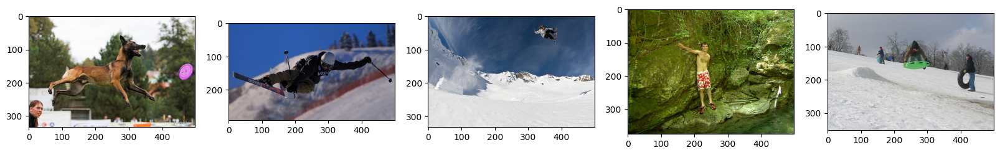

In [ ]:
#Visualise both the images & text present in the dataset
import imageio

#Visualising first 5 images :

Display_Images = all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
  ax.imshow(imageio.imread(image), cmap=None)

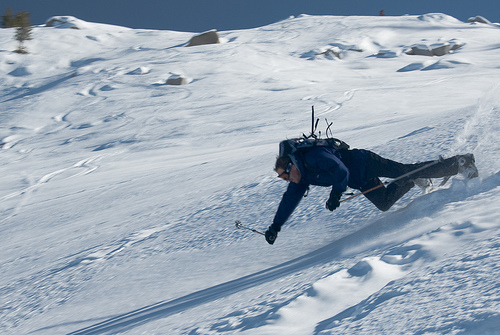

In [ ]:
# view a random image

import random
Image.open(all_imgs[random.randrange(40, 60, 3)])


In [ ]:
#txt_file = 'Flickr8K/captions.txt'
w1 = "/content/drive/MyDrive/dissertation/updated_english_captions.txt"
def load_doc(filename):

    #your code here
    open_file = open(w1, 'r', encoding='latin-1' ) #returns a file object
    text = open_file.read() #reads contents of the file
    open_file.close()
    #print(text)

    return text

doc = load_doc(w1)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


In [ ]:
# Now, read the updated Hindi captions file just as you did with the English captions
w2 = '/content/drive/MyDrive/dissertation/updated_hindi_captions.txt'

def load_doc(filename):

    # Your code here
    open_file = open(w2, 'r', encoding='utf-8') #returns a file object
    text = open_file.read() #reads contents of the file
    open_file.close()
    #print(text)

    return text

doc = load_doc(w2)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।
1000268201_693b08cb0e.jpg,एक लड़की लकड़ी की इमारत में जा रही है।
1000268201_693b08cb0e.jpg,एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।
1000268201_693b08cb0e.jpg,एक छोटी सी लड़की अ


##2.3 Create a list which contains all the captions & path¶
We will create three lists here and finally combine them to form a dataframe
1. all_img_id = [] to store all the image id
2. all_img_vector = [] to store all the image path
3. annotations = []  to store all the captions

In [ ]:
img_path = '/content/drive/MyDrive/final_project/Images/'
all_img_id = [] #store all the image id here
all_img_vector = [] #store all the image path here
annotations = [] #store all the captions here

with open('/content/drive/MyDrive/dissertation/updated_english_captions.txt' , 'r') as fo:
  next(fo) #to skip the heading
  for line in fo :
    split_arr = line.split(',')
    all_img_id.append(split_arr[0])
    annotations.append(split_arr[1].rstrip('\n.')) #removing out the \n.
    all_img_vector.append(img_path+split_arr[0])

df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions'])

df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way
1,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,A girl going into a wooden building
2,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse
3,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse
4,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin
...,...,...,...
40445,997722733_0cb5439472.jpg,/content/drive/MyDrive/final_project/Images/997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40446,997722733_0cb5439472.jpg,/content/drive/MyDrive/final_project/Images/997722733_0cb5439472.jpg,A man is rock climbing high in the air
40447,997722733_0cb5439472.jpg,/content/drive/MyDrive/final_project/Images/997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock face covered in assist handles
40448,997722733_0cb5439472.jpg,/content/drive/MyDrive/final_project/Images/997722733_0cb5439472.jpg,A rock climber in a red shirt


In [ ]:
# Define the paths for images and captions
img_path = '/content/drive/MyDrive/final_project/Images/'

# Create lists to store image IDs, image paths, and captions for Hindi dataset
all_img_id_hindi = []  # Store all the image IDs here
all_img_vector_hindi = []  # Store all the image paths here
annotations_hindi = []  # Store all the captions here

# Open the updated Hindi captions file
with open('/content/drive/MyDrive/dissertation/updated_hindi_captions.txt', 'r', encoding='utf-8') as fo:
    next(fo)  # Skip the heading if there is one
    for line in fo:
        split_arr = line.split(',')
        all_img_id_hindi.append(split_arr[0])
        annotations_hindi.append(split_arr[1].rstrip('\n.'))  # Removing the \n. from the captions
        all_img_vector_hindi.append(img_path + split_arr[0])

# Combine the lists into a DataFrame
df_hindi = pd.DataFrame(list(zip(all_img_id_hindi, all_img_vector_hindi, annotations_hindi)), columns=['ID', 'Path', 'Captions'])

# Display the first few rows of the DataFrame
df_hindi.head()


,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।
1,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,एक लड़की लकड़ी की इमारत में जा रही है।
2,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।
3,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।
4,1000268201_693b08cb0e.jpg,/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg,एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।


In [ ]:
# Print the first few original Hindi captions to inspect
print(annotations_hindi[:5])


['गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।', 'एक लड़की लकड़ी की इमारत में जा रही है।', 'एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।', 'एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।', 'एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।']


In [ ]:
len (annotations)

40450

In [ ]:
type (annotations)

list

In [ ]:
#Create the vocabulary & the counter for the captions
#lower() used to ensure same count irrespective of an alphabet's case

vocabulary = [word.lower() for line in annotations for word in line.split()]

val_count = Counter(vocabulary)
val_count

Counter({'a': 60191,
         'child': 1507,
         'in': 18171,
         'pink': 702,
         'dress': 332,
         'is': 9069,
         'climbing': 490,
         'up': 1215,
         'set': 105,
         'of': 6495,
         'stairs': 109,
         'an': 2325,
         'entry': 1,
         'way': 48,
         'girl': 3277,
         'going': 145,
         'into': 1046,
         'wooden': 278,
         'building': 485,
         'little': 1736,
         'playhouse': 6,
         'the': 17504,
         'to': 3005,
         'her': 1102,
         'cabin': 4,
         'black': 3620,
         'dog': 7948,
         'and': 8057,
         'spotted': 36,
         'are': 3365,
         'fighting': 130,
         'tri-colored': 12,
         'playing': 1954,
         'with': 7304,
         'each': 399,
         'other': 667,
         'on': 10357,
         'road': 380,
         'white': 3705,
         'brown': 2457,
         'spots': 28,
         'staring': 57,
         'at': 2810,
         'stree

a :  60191
in :  18171
the :  17504
on :  10357
is :  9069
and :  8057
dog :  7948
with :  7304
man :  7133
of :  6495
two :  5132
white :  3705
black :  3620
boy :  3514
are :  3365
woman :  3304
girl :  3277
to :  3005
wearing :  2916
people :  2811
at :  2810
water :  2673
young :  2587
red :  2553
brown :  2457
an :  2325
his :  2255
blue :  2122
dogs :  2095
running :  1996


Text(0, 0.5, 'Count')

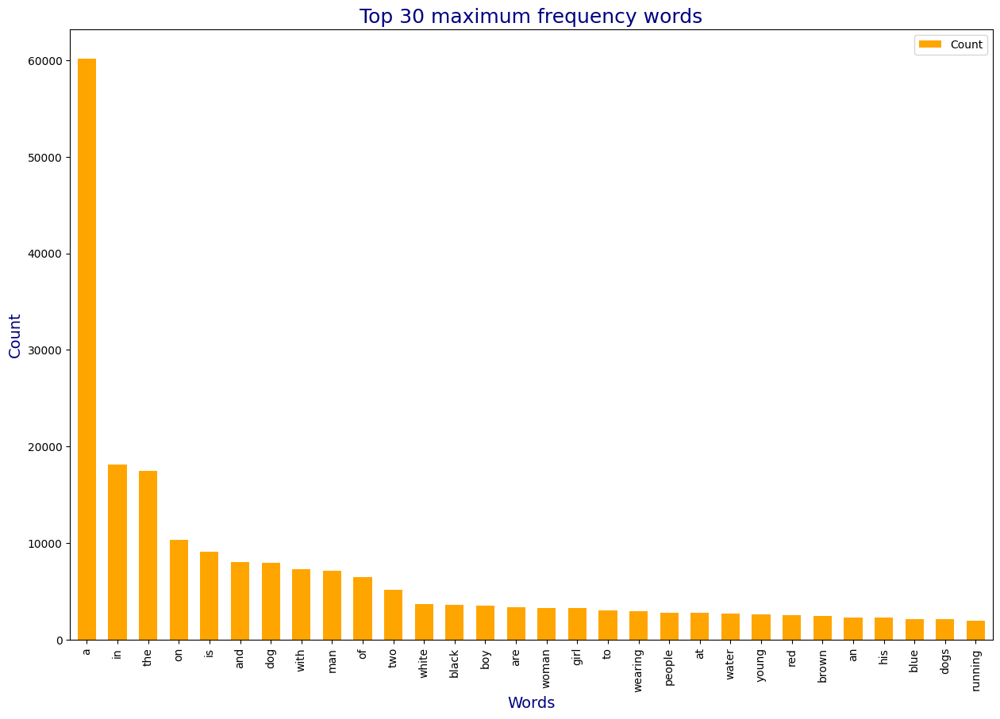

In [ ]:
#Visualise the top 30 occuring words in the captions

#write your code here
for word, count in val_count.most_common(30):
  print(word, ": ", count)

lst = val_count.most_common(30)
most_common_words_df = pd.DataFrame(lst, columns = ['Word', 'Count'])
most_common_words_df.plot.bar(x='Word', y='Count', width=0.6, color='orange', figsize=(15, 10))
plt.title("Top 30 maximum frequency words", fontsize = 18, color= 'navy')
plt.xlabel("Words", fontsize = 14, color= 'navy')
plt.ylabel("Count", fontsize = 14, color= 'navy')

In [ ]:
# Length and type of the Hindi annotations
print("Number of Hindi captions:", len(annotations_hindi))
print("Type of Hindi captions:", type(annotations_hindi))

# Create the vocabulary & the counter for the Hindi captions
# Tokenize and lower() used to ensure same count irrespective of an alphabet's case

vocabulary_hindi = [word.lower() for line in annotations_hindi for word in line.split()]

# Count the occurrences of each word in the Hindi vocabulary
val_count_hindi = Counter(vocabulary_hindi)
val_count_hindi

# Visualize the top 30 occurring words in the Hindi captions

# Display the most common words and their counts
for word, count in val_count_hindi.most_common(30):
    print(word, ": ", count)

# Convert the list of most common words and their counts into a DataFrame for visualization
lst_hindi = val_count_hindi.most_common(30)
most_common_words_df_hindi = pd.DataFrame(lst_hindi, columns=['Word', 'Count'])



Number of Hindi captions: 40450
Type of Hindi captions: <class 'list'>
एक :  51543
के :  21255
है। :  21187
में :  20269
पर :  13476
और :  8900
की :  7573
रहा :  6836
हैं। :  6605
से :  6123
आदमी :  5908
कुत्ता :  5751
दो :  5604
साथ :  5520
है :  5240
को :  4672
का :  4383
रंग :  4009
सफेद :  3799
कुत्ते :  3248
हुए :  3216
लड़का :  3069
महिला :  3060
लड़की :  3023
पहने :  2996
पानी :  2850
रहे :  2688
लाल :  2670
अपने :  2295
घास :  2150


In [ ]:
# You can download the Noto Sans Devanagari font
!apt-get install fonts-noto

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-noto-cjk fonts-noto-cjk-extra fonts-noto-color-emoji fonts-noto-core fonts-noto-extra
  fonts-noto-mono fonts-noto-ui-core fonts-noto-ui-extra fonts-noto-unhinted
The following NEW packages will be installed:
  fonts-noto fonts-noto-cjk fonts-noto-cjk-extra fonts-noto-color-emoji fonts-noto-core
  fonts-noto-extra fonts-noto-mono fonts-noto-ui-core fonts-noto-ui-extra fonts-noto-unhinted
0 upgraded, 10 newly installed, 0 to remove and 45 not upgraded.
Need to get 317 MB of archives.
After this operation, 789 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-core all 20201225-1build1 [12.2 MB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-noto all 20201225-1build1 [16.8 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:2022

In [ ]:
from matplotlib.font_manager import fontManager

for font in fontManager.ttflist:
    print(font.name, font.fname)

STIXSizeOneSym /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXSizOneSymBol.ttf
cmmi10 /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/cmmi10.ttf
DejaVu Serif /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSerif-Bold.ttf
STIXSizeThreeSym /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXSizThreeSymBol.ttf
STIXGeneral /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf
STIXGeneral /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBolIta.ttf
STIXGeneral /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralItalic.ttf
STIXNonUnicode /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUniBolIta.ttf
cmss10 /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/cmss10.ttf
STIXSizeFourSym /usr/local/lib/python3.10/dist-packages/matplotlib/mpl-data/fonts/ttf/STI

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 108 (l) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 112 (p) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 84 (T) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 111 (o) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 77 (M) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 97 (a) missing from current font.
  fig.canvas.print_figure(bytes_io, *

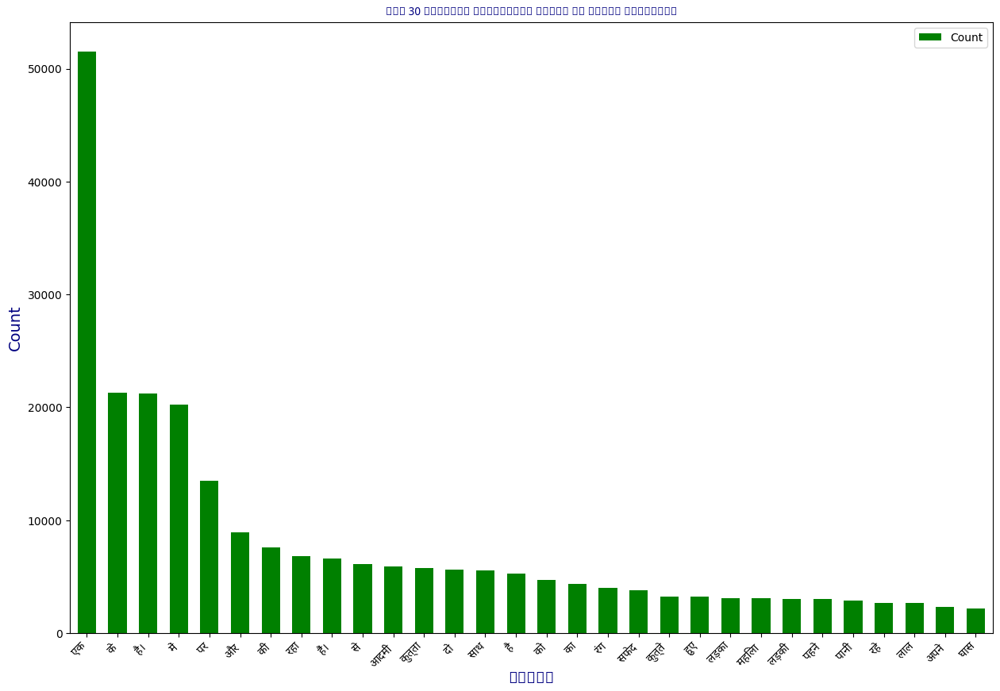

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
from matplotlib.font_manager import FontProperties

# Assuming `vocabulary_hindi` is the list containing the tokenized Hindi words
val_count_hindi = Counter(vocabulary_hindi)
lst_hindi = val_count_hindi.most_common(30)

# Convert the list of most common words and their counts into a DataFrame for visualization
most_common_words_df_hindi = pd.DataFrame(lst_hindi, columns=['Word', 'Count'])

# Use a font that should be available in most environments (fallback to a simpler font)
font_path = '/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf'  # Example for Linux
prop = FontProperties(fname=font_path)

# Plotting the top 30 most frequent words in the Hindi captions
most_common_words_df_hindi.plot.bar(x='Word', y='Count', width=0.6, color='green', figsize=(15, 10))

# Update the font properties for the x-axis labels
plt.xticks(fontproperties=prop, rotation=45, ha='right')

plt.title("Top 30 Maximum Frequency Words in Hindi Captions", fontsize=18, color='navy', fontproperties=prop)
plt.xlabel("Words", fontsize=14, color='navy', fontproperties=prop)
plt.ylabel("Count", fontsize=14, color='navy')
plt.show()


##Clearly STOPWORDS form a clear majority¶
Stop words are a set of commonly used words in a language.

Examples of stop words in English are “a”, “the”, “is”, “are” and etc.

Stop words are commonly used in Text Mining and Natural Language Processing (NLP) to eliminate words that are so commonly used that they carry very little useful information.

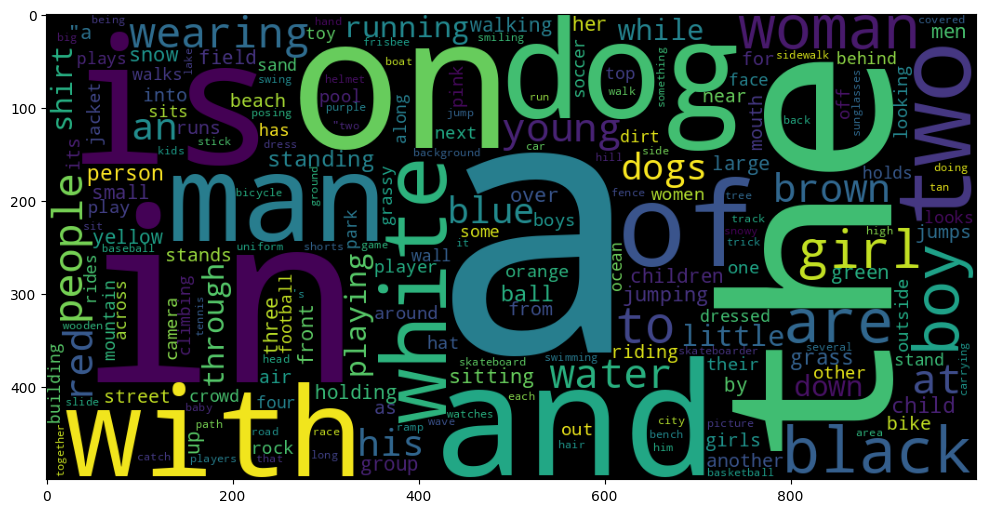

In [ ]:
## check out the top 30 stopwords with higher frequency

wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(val_count)
plt.figure(figsize = (12, 12))
plt.imshow(wordcloud)

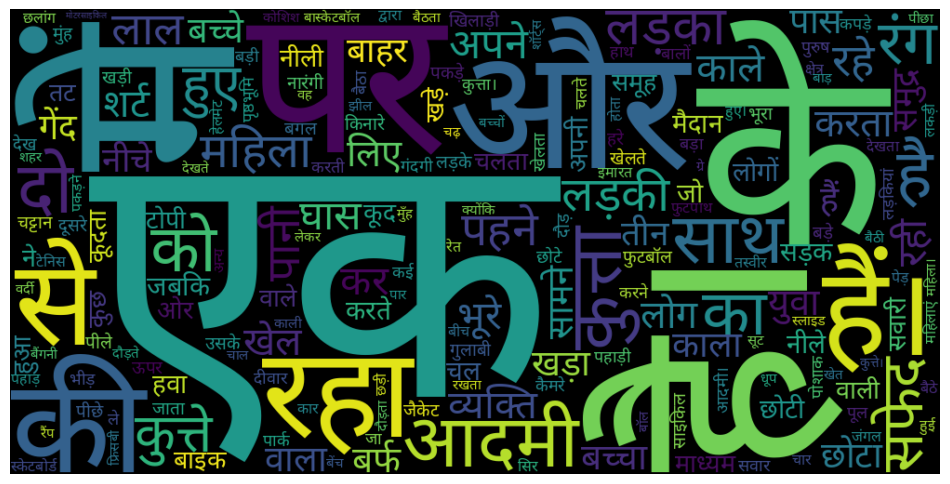

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming val_count_hindi is the Counter object containing the word frequencies for Hindi text
wordcloud_hindi = WordCloud(width=1000, height=500, font_path='/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf').generate_from_frequencies(val_count_hindi)

# Plot the word cloud
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud_hindi, interpolation='bilinear')
plt.axis('off')  # No axes for the word cloud
plt.show()


### Visualize the images and captions together

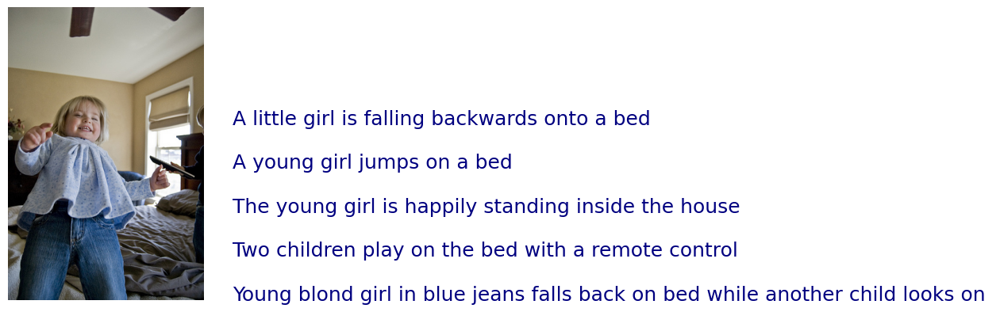

In [ ]:
def caption_with_img_plot(image_id, frame) :
  #get the captions
  capt = ("\n" *2).join(frame[frame['ID'] == image_id].Captions.to_list())
  fig, ax = plt.subplots()
  ax.set_axis_off()
  idx = df.ID.to_list().index(image_id)
  im =  Image.open(df.Path.iloc[idx])
  w, h = im.size[0], im.size[-1]
  ax.imshow(im)
  ax.text(w+50, h, capt, fontsize = 18, color = 'navy')
caption_with_img_plot(df.ID.iloc[8049], df)


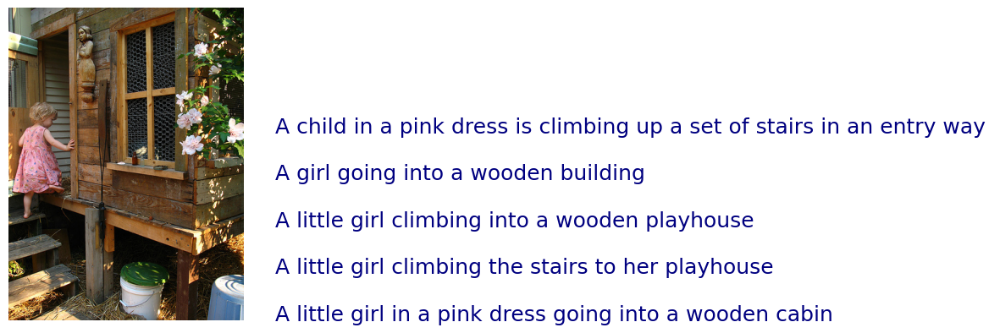

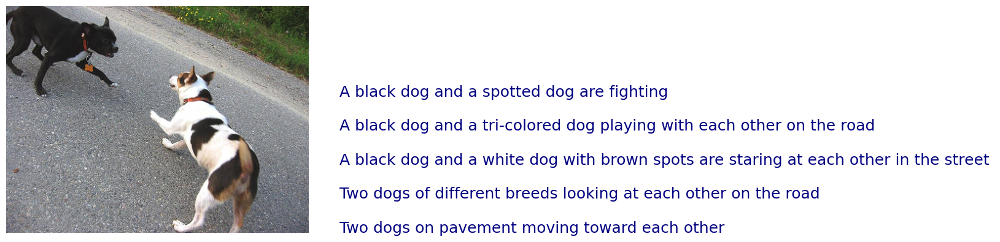

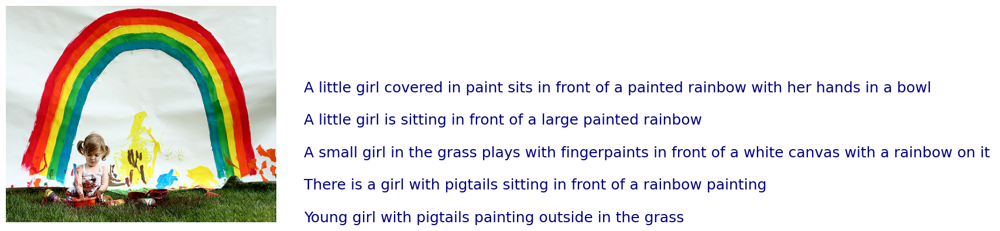

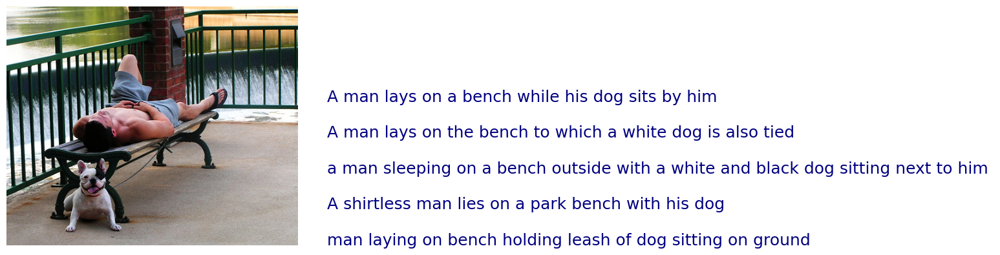

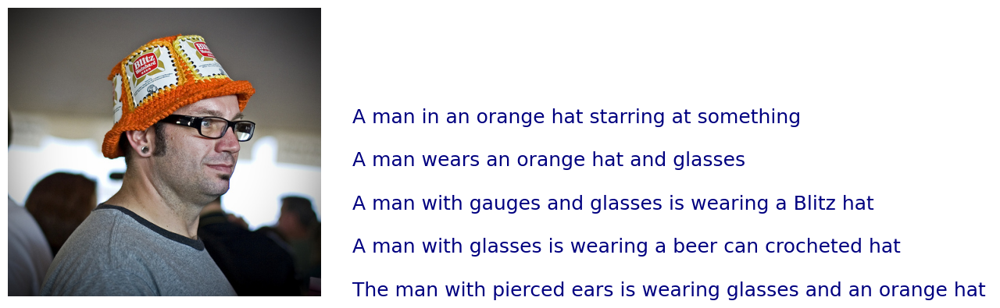

In [ ]:
def execute_img_capt(start, end, frame) :
  for r in range(start, end) :
    caption_with_img_plot(frame.ID.drop_duplicates().iloc[r], frame)

execute_img_capt(0, 5, df)

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 108 (l) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 112 (p) missing from current font.
  func(*args, **kwargs)


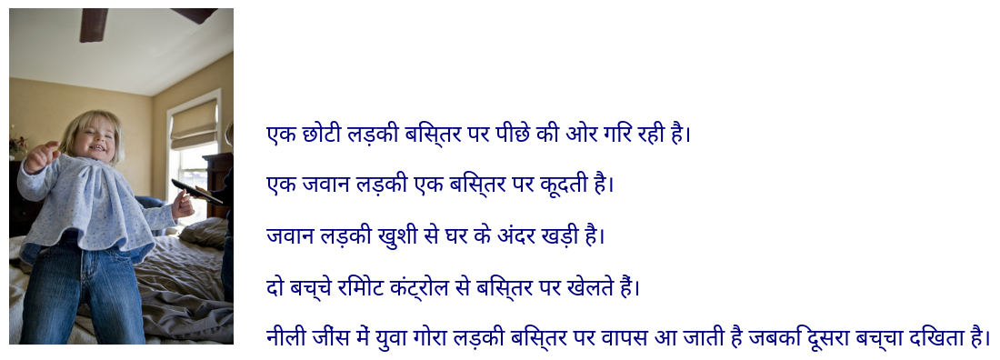

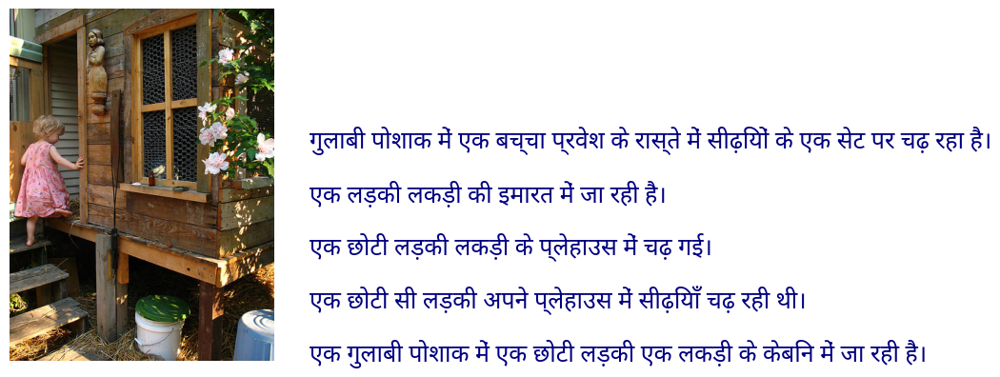

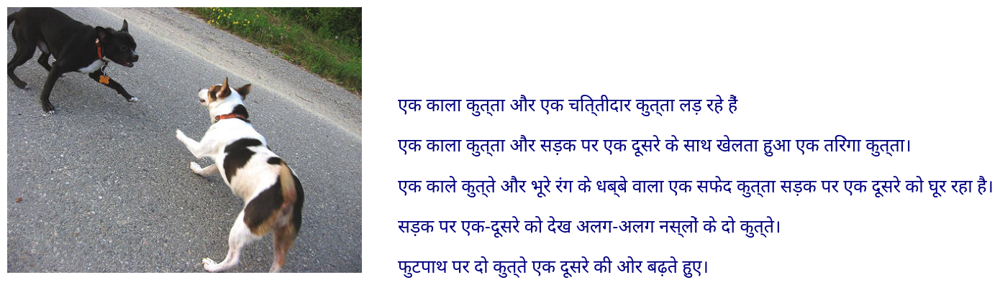

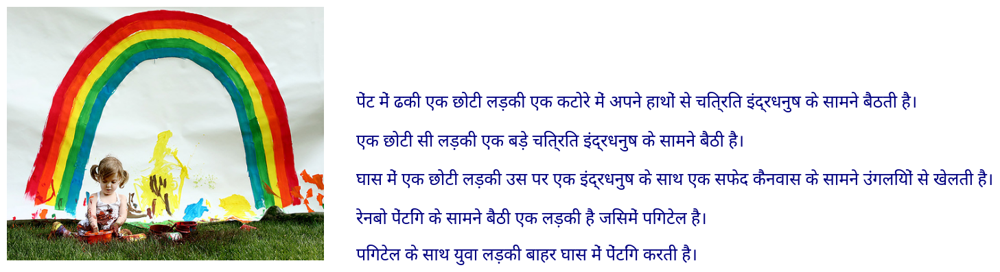

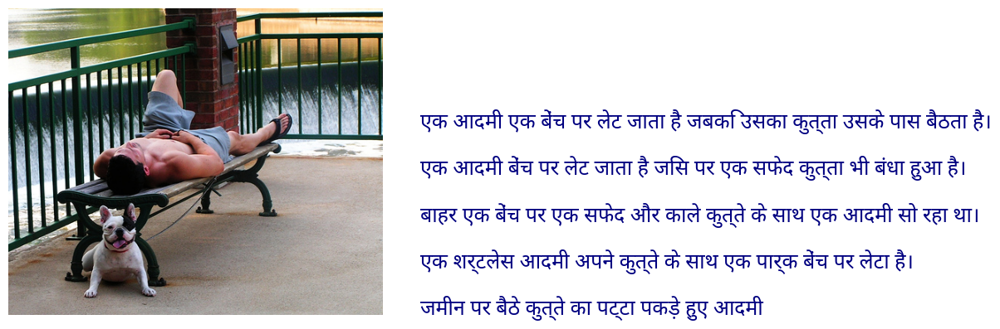

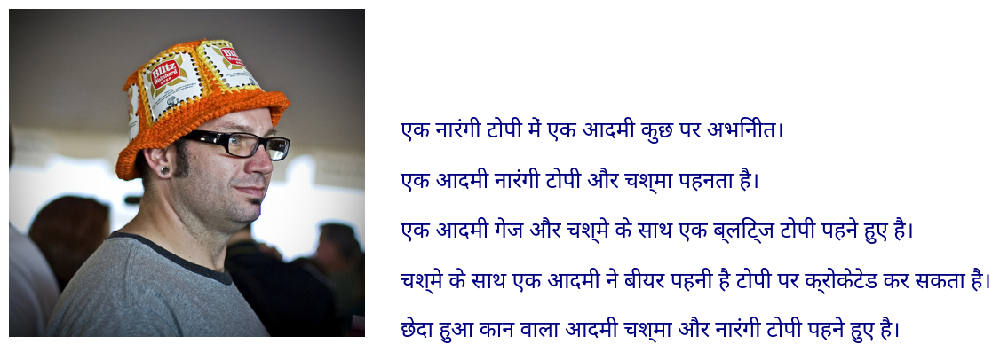

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# Set the font properties to a font that supports Devanagari
font_path = '/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf'
prop = FontProperties(fname=font_path)

# Now, when plotting, you can set the font properties
def caption_with_img_plot_hindi(image_id, frame):
    # Get the captions
    capt = ("\n" * 2).join(frame[frame['ID'] == image_id].Captions.to_list())
    fig, ax = plt.subplots()
    ax.set_axis_off()
    idx = frame.ID.to_list().index(image_id)
    im = Image.open(frame.Path.iloc[idx])
    w, h = im.size[0], im.size[-1]
    ax.imshow(im)
    ax.text(w + 50, h, capt, fontsize=18, color='navy', fontproperties=prop)

# Use the function for a single image
caption_with_img_plot_hindi(df_hindi.ID.iloc[8049], df_hindi)

# Function to visualize multiple images and captions
def execute_img_capt_hindi(start, end, frame):
    for r in range(start, end):
        caption_with_img_plot_hindi(frame.ID.drop_duplicates().iloc[r], frame)

# Visualize a range of images
execute_img_capt_hindi(0, 5, df_hindi)


##Clean Data


###Remove punctuations
###Convert captions to lowercase
###Retain words and eliminate numeric values

In [ ]:
#data cleaning
rem_punct = str.maketrans('', '', string.punctuation)
for r in range(len(annotations)) :
  line = annotations[r]
  line = line.split()

  # converting to lowercase
  line = [word.lower() for word in line]

  # remove punctuation from each caption and hanging letters
  line = [word.translate(rem_punct) for word in line]
  line = [word for word in line if len(word) > 1]

  # remove numeric values
  line = [word for word in line if word.isalpha()]

  annotations[r] = ' '.join(line)

In [ ]:
#add the <start> & <end> token to all those captions as well
annotations = ['<start>' + ' ' + line + ' ' + '<end>' for line in annotations]

#Create a list which contains all the path to the images
all_img_path = all_img_vector

In [ ]:
##list contatining captions for an image
annotations[0:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

In [ ]:
# Print the first few original Hindi captions to inspect
print(annotations_hindi[:5])


['गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।', 'एक लड़की लकड़ी की इमारत में जा रही है।', 'एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।', 'एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।', 'एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।']


In [ ]:
import string

# Define punctuation marks to be removed
rem_punct = str.maketrans('', '', string.punctuation)

# Data cleaning for Hindi captions
annotations_hindi_cleaned = []
for line in annotations_hindi:
    # Remove any existing <start> and <end> tokens before processing
    line = line.replace('<start>', '').replace('<end>', '').strip()

    # Remove punctuation from each word
    words = line.translate(rem_punct).split()

    # Rejoin the cleaned words into a sentence
    cleaned_sentence = ' '.join(words)

    # Add the cleaned sentence to the list
    annotations_hindi_cleaned.append(cleaned_sentence)

# Check the cleaned Hindi captions
print("Cleaned Captions: ", annotations_hindi_cleaned[:5])


Cleaned Captions:  ['गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है।', 'एक लड़की लकड़ी की इमारत में जा रही है।', 'एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई।', 'एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी।', 'एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है।']


In [ ]:
# Now add the <start> and <end> tokens after ensuring the text is clean
annotations_hindi_final = ['<start> ' + line + ' <end>' for line in annotations_hindi_cleaned]
#Create a list which contains all the path to the images
all_img_path = all_img_vector
# Display the first 5 cleaned and tokenized Hindi captions
print("Final Captions: ", annotations_hindi_final[:5])


Final Captions:  ['<start> गुलाबी पोशाक में एक बच्चा प्रवेश के रास्ते में सीढ़ियों के एक सेट पर चढ़ रहा है। <end>', '<start> एक लड़की लकड़ी की इमारत में जा रही है। <end>', '<start> एक छोटी लड़की लकड़ी के प्लेहाउस में चढ़ गई। <end>', '<start> एक छोटी सी लड़की अपने प्लेहाउस में सीढ़ियाँ चढ़ रही थी। <end>', '<start> एक गुलाबी पोशाक में एक छोटी लड़की एक लकड़ी के केबिन में जा रही है। <end>']


#Data Preprocessing

¶
4.1 Captions Preprocessing:
Pre-Processing the captions

Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters. This gives us a vocabulary of all of the unique words in the data. Keep the total vocaublary to top 5,000 words for saving memory.

Replace all other words with the unknown token "UNK" .

Create word-to-index and index-to-word mappings.

Pad all sequences to be the same length as the longest one.

In [ ]:
!pip install tensorflow

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

top_word_cnt = 5000
tokenizer = Tokenizer(num_words=top_word_cnt+1,
                      filters='!"#$%^&*()_+.,:;-?/~`{}[]|\\=@ ',
                      lower=True, char_level=False,
                      oov_token='UNK')


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
import collections

# Set the top number of words to include in the vocabulary
top_word_cnt = 5000

# Define the tokenizer with the same settings for Hindi
tokenizer_hindi = Tokenizer(num_words=top_word_cnt+1,
                            filters='!"#$%^&*()_+.,:;-?/~`{}[]|\\=@ ',
                            lower=True, char_level=False,
                            oov_token='UNK')

In [ ]:
# Create word-to-index and index-to-word mappings.

#your code here

tokenizer.fit_on_texts(annotations)

#transform each text into a sequence of integers
train_seqs = tokenizer.texts_to_sequences(annotations)

In [ ]:
# Fit the tokenizer on Hindi captions
tokenizer_hindi.fit_on_texts(annotations_hindi_final)

# Transform the Hindi captions into sequences of integers
train_seqs_hindi = tokenizer_hindi.texts_to_sequences(annotations_hindi_final)


#Why Padding ?¶
Each individual image has five captions which are all of different lengths. Hence they can't be fed directly to the Decoder.

We will use PADDING, to bring all captions to a fixed length before proceeding further.

Padding is a process that we apply at the start or the end of a sequence to make all the samples to have a common standard length.

For text generation, the decoder needs to have an input at the start and it can't be a padded input.

Therefore, for our process, we will be doing the padding at the end (of the caption sequence).

All padded values will be masked and set to 'False' while the rest will be set to 'True'

All True values are assigned the value : 1, while padded, i.e False values are set to 0

Padding can result in a risk of adding penalty to the model.

We apply masking to rectify the same and this will truncate down all the added penalties back to zero :

Loss = Loss * Mask
As we will use pad_sequence to process the sequence, we will use 0 as the padding value.

Keras uses a different index for UNKNOWN, in order to distinguish between PAD and UNKNOWN

0 is the reserved index which has no word assigned.

In [ ]:
# we add PAD token for zero

tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [ ]:
print(tokenizer.oov_token)
print(tokenizer.index_word[0])

UNK
PAD


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Apply padding to the Hindi sequences
train_seqs_hindi_padded = pad_sequences(train_seqs_hindi, padding='post')

# Assign PAD token to 0 index in word index mapping
tokenizer_hindi.word_index['PAD'] = 0
tokenizer_hindi.index_word[0] = 'PAD'


In [ ]:
print(tokenizer_hindi.oov_token)
print(tokenizer_hindi.index_word[0])

UNK
PAD


View index words

In [ ]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'little',
 38: 'shirt',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'front',
 49: 'sitting',
 50: 'small',
 51: 'field',
 52: 'up',
 53: 'holding',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'children',
 60: 'walking',
 61: 'men',
 62: 'her',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: 'it

In [ ]:
print("OOV Token:", tokenizer_hindi.oov_token)
print("Index for PAD token:", tokenizer_hindi.index_word[0])

# View index words
print("Sample Index Words:", list(tokenizer_hindi.index_word.items())[:30])


OOV Token: UNK
Index for PAD token: PAD
Sample Index Words: [(1, 'UNK'), (2, 'एक'), (3, '<start>'), (4, '<end>'), (5, 'के'), (6, 'है।'), (7, 'में'), (8, 'पर'), (9, 'और'), (10, 'की'), (11, 'रहा'), (12, 'हैं।'), (13, 'से'), (14, 'आदमी'), (15, 'कुत्ता'), (16, 'दो'), (17, 'साथ'), (18, 'है'), (19, 'को'), (20, 'का'), (21, 'रंग'), (22, 'सफेद'), (23, 'कुत्ते'), (24, 'हुए'), (25, 'लड़का'), (26, 'महिला'), (27, 'लड़की'), (28, 'पहने'), (29, 'पानी'), (30, 'रहे')]


In [ ]:
# Create a word count of your tokenizer to visualize the Top 30 occuring words after text processing

#your code here
tokenizer_top_words = [word for line in annotations for word in line.split() ]

#tokenizer_top_words_count
tokenizer_top_words_count = collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

Counter({'<start>': 40450,
         'child': 1517,
         'in': 18179,
         'pink': 702,
         'dress': 332,
         'is': 9069,
         'climbing': 490,
         'up': 1215,
         'set': 105,
         'of': 6496,
         'stairs': 109,
         'an': 2358,
         'entry': 1,
         'way': 48,
         '<end>': 40450,
         'girl': 3284,
         'going': 145,
         'into': 1046,
         'wooden': 278,
         'building': 485,
         'little': 1750,
         'playhouse': 6,
         'the': 17673,
         'to': 3005,
         'her': 1102,
         'cabin': 4,
         'black': 3627,
         'dog': 7956,
         'and': 8057,
         'spotted': 36,
         'are': 3365,
         'fighting': 130,
         'tricolored': 12,
         'playing': 1954,
         'with': 7308,
         'each': 399,
         'other': 667,
         'on': 10367,
         'road': 380,
         'white': 3709,
         'brown': 2471,
         'spots': 28,
         'staring': 57,
      

In [ ]:
# Create a list of words from the tokenized Hindi captions
tokenizer_top_words_hindi = [word for line in annotations_hindi_final for word in line.split()]

# Count the occurrences of each word
tokenizer_top_words_count_hindi = collections.Counter(tokenizer_top_words_hindi)

# Print the most common words and their counts
for word, count in tokenizer_top_words_count_hindi.most_common(30):
    print(word, ": ", count)


एक :  51544
<start> :  40450
<end> :  40450
के :  21255
है। :  21187
में :  20269
पर :  13476
और :  8900
की :  7573
रहा :  6836
हैं। :  6605
से :  6123
आदमी :  5909
कुत्ता :  5752
दो :  5604
साथ :  5521
है :  5256
को :  4672
का :  4383
रंग :  4009
सफेद :  3799
कुत्ते :  3248
हुए :  3216
लड़का :  3069
महिला :  3060
लड़की :  3023
पहने :  2996
पानी :  2850
रहे :  2688
लाल :  2670


एक :  51544
<start> :  40450
<end> :  40450
के :  21255
है। :  21187
में :  20269
पर :  13476
और :  8900
की :  7573
रहा :  6836
हैं। :  6605
से :  6123
आदमी :  5909
कुत्ता :  5752
दो :  5604
साथ :  5521
है :  5256
को :  4672
का :  4383
रंग :  4009
सफेद :  3799
कुत्ते :  3248
हुए :  3216
लड़का :  3069
महिला :  3060
लड़की :  3023
पहने :  2996
पानी :  2850
रहे :  2688
लाल :  2670


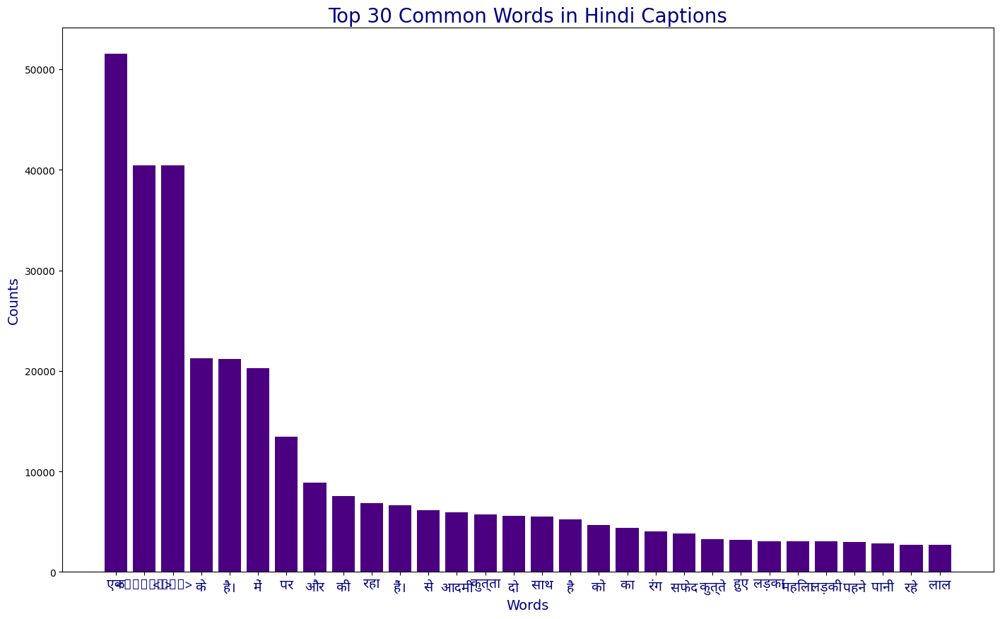

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# Specify the font path for Devanagari script
devanagari_font_path = "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf"
devanagari_font = FontProperties(fname=devanagari_font_path)

# Print the top 30 most common words in the Hindi captions
for word, count in tokenizer_top_words_count_hindi.most_common(30):
    print(word, ": ", count)

# Get the top 30 most common words and their counts
tokens_hindi = tokenizer_top_words_count_hindi.most_common(30)
most_com_words_df_hindi = pd.DataFrame(tokens_hindi, columns=['Word', 'Count'])

# Plot the top 30 most common words with the specified Devanagari font
plt.figure(figsize=(17, 10))
plt.bar(most_com_words_df_hindi['Word'], most_com_words_df_hindi['Count'], color='indigo')

# Set the font for x-axis labels to Devanagari
plt.xticks(fontproperties=devanagari_font, fontsize=14, color='navy')
plt.title('Top 30 Common Words in Hindi Captions', fontsize=20, color='navy')
plt.xlabel('Words', fontsize=14, color='navy')
plt.ylabel('Counts', fontsize=14, color='navy')

plt.show()


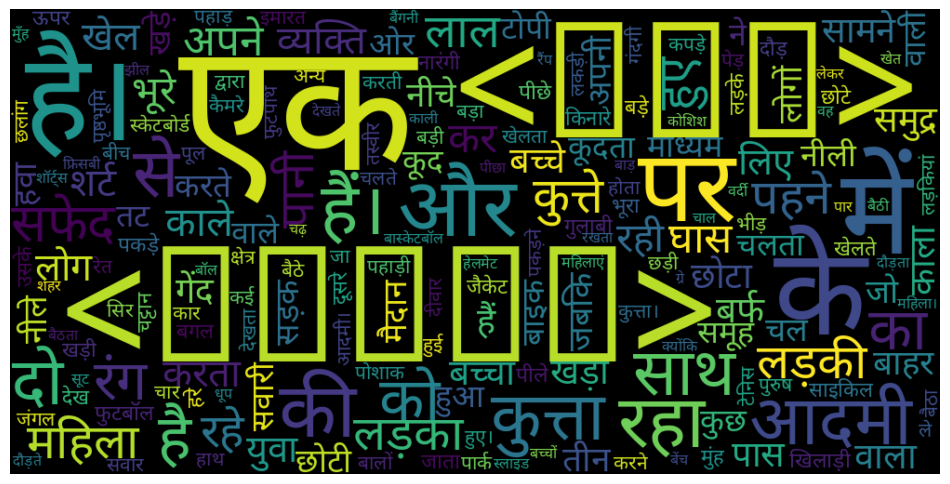

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# Specify the font path for Devanagari script
devanagari_font_path = "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf"

# Generate a word cloud using the tokenizer_top_words_count_hindi
wordcloud_token_hindi = WordCloud(
    width=1000,
    height=500,
    font_path=devanagari_font_path  # Specify the Devanagari font path
).generate_from_frequencies(tokenizer_top_words_count_hindi)

# Plot the word cloud
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud_token_hindi, interpolation="bilinear")
plt.axis("off")  # Turn off the axis
plt.show()


In [ ]:
# Pad each vector to the max_length of the captions ^ store it to a vairable

#store the length of all lists
train_seqs_len = [len(seq) for seq in train_seqs]

#store elements from list with maximum value
longest_word_length = max(train_seqs_len)

#calculate longest word_length and pads all sequences to equal length as that of the longest.
cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)

print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(40450, 31)


NOTE : Using padding = 'post', we are padding zero at last. Starting word always acts as a crucial prompter and another word is expected after that. Zero at the beginning would indicate no value.

Hence in order to maintain existing sequence and it's meaning, we apply PADDING at the end.

In [ ]:
# Assuming 'train_seqs_hindi' is the tokenized sequence for Hindi captions

# Store the length of all lists for Hindi captions
train_seqs_len_hindi = [len(seq) for seq in train_seqs_hindi]

# Find the maximum sequence length in the Hindi captions
longest_word_length_hindi = max(train_seqs_len_hindi)

# Pad each Hindi sequence to the maximum length
cap_vector_hindi = tf.keras.preprocessing.sequence.pad_sequences(
    train_seqs_hindi,
    padding='post',
    maxlen=longest_word_length_hindi,
    dtype='int32',
    value=0
)

print("The shape of the Hindi Caption vector is: " + str(cap_vector_hindi.shape))

# NOTE: The padding is applied at the end of each sequence using 'post'.
# This maintains the sequence structure, as the starting words are crucial in sentence construction.


The shape of the Hindi Caption vector is: (40450, 42)


## Image preprocessing

1.Resize them into the shape of (299, 299)

2.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3.

FAQs on how to resize the images::
Since you have a list which contains all the image path, you need to first convert them to a dataset using tf.data.Dataset.from_tensor_slices. Once you have created a dataset consisting of image paths, you need to apply a function to the dataset which will apply the necessary preprocessing to each image.
This function should resize them and also should do the necessary preprocessing that it is in correct format for InceptionV3.

In [ ]:
# creating list to store preprocessed images and setting up the Image Shape

preprocessed_image = []
IMAGE_SHAPE = (299, 299)

In [ ]:
#checking image format

tf.keras.backend.image_data_format()

'channels_last'

###Image data format = 'channels_last' indicates Image is in three dimensional array, where third dim represents color channels (RGB)

1st dim = rows

2nd dim = columns

3rd dim = channels

In [ ]:
#write your code here for creating the function. This function should return images & their path

#write your pre-processing steps here (checking only for the first five images here)
for img in all_imgs[0:5] :
    img = tf.io.read_file(img, name=None)

    # we need to decode jpeg encoded images (here by default channels = 0)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)

    #append preprocessed images to the list
    preprocessed_image.append(img)

Shape after resize : 

 (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)


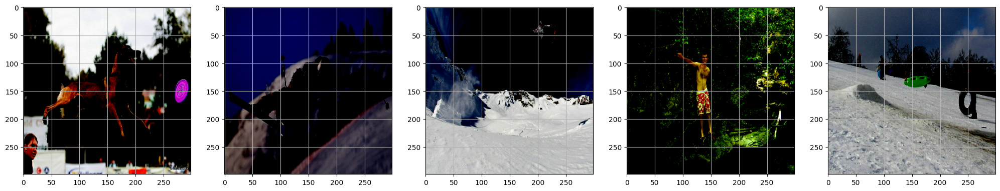

In [ ]:
# checking first five images post preprocessing

Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)

for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

###Dataset Creation


1.Create a function which maps the image path to their feature.

2.Create a builder function to create train & test dataset & apply the function created earlier to transform the dataset

3.Apply train_test_split on both image path & captions to create the train & test list. Create the train-test spliit using 80-20 ratio & random state = 42

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 8*8, 2048)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)

We will have a function here for preprocessing and returing images, so that we can use it for vectorization and preprocesses images parallelly

In [ ]:
## write your code here for applying the function to the image path dataset,
## such that the transformed dataset should contain images & their path


def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

In [ ]:
all_img_vector

['/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
 '/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
 '/content/drive/MyDrive/final_project/Images/1002674143_1b742ab4b8.jpg',
 '/content/drive/MyDrive/final_project/Images/1002674143_1b742ab4b8.jpg',
 '/content/drive/MyDrive/final_project/Images/1002674143_1b742ab4b8.jpg',
 '/content/drive/MyDrive/final_project

In [ ]:
# Map each image full path to the function, in order to preprocess the image

## sort the unique paths and store in a list
training_list = sorted(set(all_img_vector))

#create a new dataset from above training list
New_Img = tf.data.Dataset.from_tensor_slices(training_list)

#map load_images function across the elements of the new dataset above
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
#Note  : Here, num_parallel_calls = tf.data.experimental.AUTOTUNE sets the number of parallel calls dynamically.
            ## based on the current GPU/CPU

#setting a batch size of 64
New_Img = New_Img.batch(64, drop_remainder=False)
#Note : As we don't want to drop the last batch if it contains less than 64 elements, we set drop_remainder to false

In [ ]:
New_Img

<BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
import tensorflow as tf

# Function to preprocess and return images
def load_images_hindi(image_path):
    img = tf.io.read_file(image_path, name=None)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, IMAGE_SHAPE)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

# Assuming all_img_vector_hindi is your list of image paths for Hindi captions
all_img_vector_hindi = all_img_vector  # This assumes the image paths are the same for both languages

# Map each image full path to the function to preprocess the image

# Sort the unique paths and store them in a list
training_list_hindi = sorted(set(all_img_vector_hindi))

# Create a new dataset from the above training list
New_Img_Hindi = tf.data.Dataset.from_tensor_slices(training_list_hindi)

# Map the load_images function across the elements of the new dataset
New_Img_Hindi = New_Img_Hindi.map(load_images_hindi, num_parallel_calls=tf.data.experimental.AUTOTUNE)
# Note: num_parallel_calls=tf.data.experimental.AUTOTUNE sets the number of parallel calls dynamically based on the current GPU/CPU

# Set a batch size of 64
New_Img_Hindi = New_Img_Hindi.batch(64, drop_remainder=False)
# Note: As we don't want to drop the last batch if it contains fewer than 64 elements, we set drop_remainder to False

New_Img_Hindi


<BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

Train-test split

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming all_img_vector and cap_vector are your lists containing image paths and captions respectively

# Select the first 2500 elements
all_img_vector_selected = all_img_vector[:20000]
cap_vector_selected = cap_vector[:20000]

# Ratio = 80:20 and we will set random state = 42
path_train, path_test, caption_train, caption_test = train_test_split(all_img_vector_selected, cap_vector_selected, test_size=0.2, random_state=42)

print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))


Training data for images: 16000
Testing data for images: 4000
Training data for Captions: 16000
Testing data for Captions: 4000


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming all_img_vector_hindi and cap_vector_hindi are your lists containing image paths and Hindi captions respectively

# Select the first 2500 elements (if applicable, adjust according to your dataset)
all_img_vector_hindi_selected = all_img_vector_hindi[:20000]
cap_vector_hindi_selected = cap_vector_hindi[:20000]

# Perform train-test split with an 80:20 ratio, setting random_state = 42 for reproducibility
path_train_hindi, path_test_hindi, caption_train_hindi, caption_test_hindi = train_test_split(
    all_img_vector_hindi_selected, cap_vector_hindi_selected, test_size=0.2, random_state=42
)

print("Training data for images (Hindi): " + str(len(path_train_hindi)))
print("Testing data for images (Hindi): " + str(len(path_test_hindi)))
print("Training data for Hindi Captions: " + str(len(caption_train_hindi)))
print("Testing data for Hindi Captions: " + str(len(caption_test_hindi)))


Training data for images (Hindi): 16000
Testing data for images (Hindi): 4000
Training data for Hindi Captions: 16000
Testing data for Hindi Captions: 4000


##oad the pretrained Imagenet weights of Inception net V3¶
1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

2.The shape of the output of this layer is 8x8x2048.

3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)

In [ ]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input #write code here to get the input of the image_model
hidden_layer = image_model.layers[-1].output  #write code here to get the output of the image_model

#build the final model using both input & output layer
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

87924736/87910968 [==============================] - 5s 0us/step


In [ ]:
# write the code to apply the feature_extraction model to your earlier created dataset which contained images & their respective paths
# Once the features are created, you need to reshape them such that feature shape is in order of (batch_size, 8*8, 2048)

image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

###NOTE : As we are not classifying the images here, there is no need to have the softmax layer at the end.¶
FAQs on how to load the features:
You can load the features using a dictionary created OR
You can store using numpy(np.load) to load the feature vector.

In [ ]:
# extract features from each image in the dataset

img_features = {}
for image, image_path in tqdm(New_Img) :
  # we are using tqdm for progress bar

  # feed images from newly created Dataset above to Inception V3 built above
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 127/127 [11:21<00:00,  5.37s/it]


In [ ]:
batch_features

<tf.Tensor: shape=(26, 8, 8, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.25059986e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 7.84950256e-02, ...,
          1.20641899e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          6.32681131e-01, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 5.71332097e-01, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.62556374e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         

In [ ]:
batch_features_flattened

<tf.Tensor: shape=(26, 64, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.2505999e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 7.8495026e-02, ...,
         1.2064190e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         6.3268113e-01, 0.0000000e+00, 0.0000000e+00],
        ...,
        [8.7625647e-01, 0.0000000e+00, 1.6435398e+00, ...,
         0.0000000e+00, 6.3447094e-01, 0.0000000e+00],
        [0.0000000e+00, 1.7307237e-01, 1.4913622e+00, ...,
         0.0000000e+00, 4.6413743e-01, 2.5294846e-01],
        [9.4506109e-01, 0.0000000e+00, 1.5161866e+00, ...,
         0.0000000e+00, 5.7819867e-01, 3.8704973e-01]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.5407271e+00, 1.2943491e+00, 0.0000000e+00],
        [0.0000000e+00, 4.5063165e-01, 0.0000000e+00, ...,
         1.3734653e+00, 1.2367326e+00, 0.0000000e+00],
        [0.000000

In [ ]:
len(img_features)

8090

In [ ]:
batch_feat.shape

TensorShape([64, 2048])

In [ ]:
#view top five items of img_features dict
import more_itertools
top_5 = more_itertools.take(5, img_features.items())

top_5

[('/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16987136],
         [0.        , 0.        , 1.0105922 , ..., 0.        , 0.        ,
          0.06111714],
         ...,
         [0.        , 0.        , 2.0380409 , ..., 1.2029705 , 0.        ,
          1.9924153 ],
         [0.        , 0.        , 0.90468884, ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2527272 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
  array([[0.        , 0.6636795 , 0.462855  , ..., 0.        , 0.        ,
          3.33226   ],
         [0.        , 1.2268165 , 0.        , ..., 0.        , 0.25390163,
          3.329532  ],
         [1.2881974 , 1.5195408 , 

In [ ]:
# Define a function to map image and tokenized caption
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption


In [ ]:
# Load the pretrained Imagenet weights of InceptionV3
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
# Define the input and output layers
new_input = image_model.input  # Input to the image model
hidden_layer = image_model.layers[-1].output  # Output from the last convolutional layer
# Build the final model using the input and output layers
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)



In [ ]:



# Display the summary of the image feature extraction model
image_features_extract_model.summary()


# Now you have img_features_hindi containing the image features for the Hindi captions dataset

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_94 (Conv2D)             (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization_94 (BatchN  (None, None, None,   96         ['conv2d_94[0][0]']              
 ormalization)                  32)                                                         

In [ ]:
# Extract features from each image in the dataset
img_features_hindi = {}
for image, image_path in tqdm(New_Img):  # Assuming New_Img is the dataset containing the Hindi image paths
    # Feed images from the newly created Dataset above to InceptionV3
    batch_features = image_features_extract_model(image)

    # Squeeze out the features in a batch
    batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

    for batch_feat, path in zip(batch_features_flattened, image_path):
        feature_path = path.numpy().decode('utf-8')
        img_features_hindi[feature_path] = batch_feat.numpy()
# Now you have img_features_hindi containing the image features for the Hindi captions dataset

100%|██████████| 127/127 [06:53<00:00,  3.26s/it]


In [ ]:
# Check the length of the image features dictionary for Hindi
len(img_features_hindi)



8090

In [ ]:
# Check the shape of a single feature vector (example)
batch_feat.shape



TensorShape([64, 2048])

In [ ]:
# View the top five items of img_features_hindi dictionary
import more_itertools
top_5_hindi = more_itertools.take(5, img_features_hindi.items())

top_5_hindi




[('/content/drive/MyDrive/final_project/Images/1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16987136],
         [0.        , 0.        , 1.0105922 , ..., 0.        , 0.        ,
          0.06111714],
         ...,
         [0.        , 0.        , 2.0380409 , ..., 1.2029705 , 0.        ,
          1.9924153 ],
         [0.        , 0.        , 0.90468884, ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2527272 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('/content/drive/MyDrive/final_project/Images/1001773457_577c3a7d70.jpg',
  array([[0.        , 0.6636795 , 0.462855  , ..., 0.        , 0.        ,
          3.33226   ],
         [0.        , 1.2268165 , 0.        , ..., 0.        , 0.25390163,
          3.329532  ],
         [1.2881974 , 1.5195408 , 

In [ ]:
# Define a function to map image and tokenized Hindi caption
def map_hindi(image_name, caption):
    img_tensor = img_features_hindi[image_name.decode('utf-8')]
    return img_tensor, caption

We will set the bufffer size to 1000 and batch size to 64

In Tensorflow, data is designed to work with huge sequences. Thus instead of shuffling entire sequence, it maintains separate buffer within which it shuffles elements. This buffer size of 1000 refers to the same.


We will set reshuffle_each_iteration to True in order to ensure different order per epoch

We will also use the prefetch function to prepare later elements as the current ones are being processed

In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):

    # your code goes here to create the dataset & transform it

    data = tf.data.Dataset.from_tensor_slices((img, capt))
    # dataset created using tf.data.Dataset.from_tensor_slices
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)


    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    # .prefetch() is used to prepare all upcoming elements, while current elements are being processed
    # We set reshuffle_each_iteration set to True in order to ensure different order per epoch
    # Also,  drop_remainder is set to False as we don't want to miss out any element if the last batch contains less than 64 elements

    return data

In [ ]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [ ]:
# Retrieve a sample batch for inspection
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 64, 2048)
(64, 31)


In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 64

def gen_dataset(img, capt_hindi):
    # Create the dataset & transform it
    data = tf.data.Dataset.from_tensor_slices((img, capt_hindi))
    # Apply mapping function
    data = data.map(lambda ele1, ele2: tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
                 .batch(BATCH_SIZE, drop_remainder=False)
                 .prefetch(tf.data.experimental.AUTOTUNE))

    return data

# Generate train and test datasets for Hindi captions
train_dataset_hindi = gen_dataset(path_train_hindi, caption_train_hindi)
test_dataset_hindi = gen_dataset(path_test_hindi, caption_test_hindi)

# Retrieve a sample batch for inspection
sample_img_batch_hindi, sample_cap_batch_hindi = next(iter(train_dataset_hindi))
print(sample_img_batch_hindi.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch_hindi.shape)  #(batch_size, max_len)


(64, 64, 2048)
(64, 42)


We will set the bufffer size to 1000 and batch size to 64

In Tensorflow, data is designed to work with huge sequences. Thus instead of shuffling entire sequence, it maintains separate buffer within which it shuffles elements. This buffer size of 1000 refers to the same.


We will set reshuffle_each_iteration to True in order to ensure different order per epoch

We will also use the prefetch function to prepare later elements as the current ones are being processed

In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):

    # your code goes here to create the dataset & transform it

    data = tf.data.Dataset.from_tensor_slices((img, capt))
    # dataset created using tf.data.Dataset.from_tensor_slices
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)


    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    # .prefetch() is used to prepare all upcoming elements, while current elements are being processed
    # We set reshuffle_each_iteration set to True in order to ensure different order per epoch
    # Also,  drop_remainder is set to False as we don't want to miss out any element if the last batch contains less than 64 elements

    return data

In [ ]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [ ]:
# Retrieve a sample batch for inspection
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 64, 2048)
(64, 31)


#Model Building


1.Set the parameters

2.Build the Encoder

3. Build the Attention Model

4. Build the Decoder

In [ ]:
# Setting  parameters

embedding_dim = 256
units = 512

#top 5,000 words +1
vocab_size = 5001
train_num_steps = len(path_train) // BATCH_SIZE #len(total train images) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE  #len(total test images) // BATCH_SIZE

max_length = 31
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

##Encoder (CNN)¶
1. The encoder parts involve the convolution of the input image with the help of various convolution, max pooling, and fully connected layers.

2. Since we are not dealing with the classification of the image, we have removed them from the end.

3. The final output of the encoder part will be the generation of the feature vector.

In [ ]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [ ]:
class Encoder(Model):
    def __init__(self, embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) # build your Dense layer with relu activation

    def call(self, features):
        features = self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features = tf.keras.activations.relu(features)  # Apply standard ReLU
        return features


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.8.0


In [ ]:
encoder=Encoder(embedding_dim)

In [ ]:
!pip install pydot
!pip install graphviz


###Note :¶
The CNN-based encoder produces the feature vector which is the encoded representation of the input image.

The resulting feature vector is static and does not change at each timestamp.

Therefore we need to pass this vector to the attention model along with the hidden state of the decoder to create the context vector.

##Attention model¶
Important Details :
Attention is an interface connecting the encoder and decoder that provides the decoder with information from every encoder hidden state.

With this framework, the model is able to selectively focus on valuable parts of the input sequence and hence, learn the association between them.

The attention model produces an output(context vector) that is fed to the decoder for predicting the word at that timestamp

This output, i.e context vector is adaptive in nature and change for each timestamp.

It aims to overcome the limitation of traditional CNN-RNN based models. Using this, instead of passing the complete input image to the RNN at every timestamp, we can pass different relevant parts of the image to it.

This makes the model faster and increase it's prediction accuracy.

In [ ]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) #build your Dense layer
        self.W2 = tf.keras.layers.Dense(units) #build your Dense layer
        self.V = tf.keras.layers.Dense(1) #build your final Dense layer with unit 1
        self.units=units

    def call(self, features, hidden):
        # features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)

        # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        hidden_with_time_axis = hidden[:, tf.newaxis]

        # build your score funciton to shape: (batch_size, 8*8, units)
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # extract your attention weights with shape: (batch_size, 8*8, 1)
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)

        #shape: create the context vector with shape (batch_size, 8*8,embedding_dim)
        context_vector = attention_weights * features

        # reduce the shape to (batch_size, embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

Note¶
1. Attention model does a linear transformation of input. Hence we have aplied tanh on top of it, in order to introduce non-linearities and achieve a smoother distribution.

2. The features produced from fully connected dense layer of encoder and the hidden state of decoder are fed to tanh function and attention score is calculated

3. As we require an output in range (0,1), we will apply softmax function to attention score and get the final attention weights

##Decoder¶
RNN - Model (GRU)

Input to GRU : Context vector (from attention model) concatenated with embedded vector (embedding layer). Output of this concatenation layer is fed to GRU as input

Embedding layer present inside the decoder takes the input sequence (preprocessed and transformed such that all samples have equal sequence length - through padding followed by masking). Embedding layer transforms this into an embedded vector.

Concatenation layer contains : Embedded vector (output of embedding layer) along with the Context vector (output of attention model)

In [ ]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units = units
        self.attention = Attention_model(self.units)
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim)
        self.gru = tf.keras.layers.GRU(
            self.units,
            return_sequences=True,
            return_state=True,
            recurrent_initializer='glorot_uniform'
        )
        self.d1 = tf.keras.layers.Dense(self.units)
        self.d2 = tf.keras.layers.Dense(vocab_size)

    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)
        embed = self.embed(x)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)

        # Capture all outputs from GRU
        gru_outputs = self.gru(embed)


        # Unpack GRU outputs appropriately (adjust based on the print results)
        output = gru_outputs[0]  # Expected sequence output
        state = gru_outputs[1]   # Hidden state

        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2]))
        output = self.d2(output)

        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


In [ ]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [ ]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


#Model for hindi

In [ ]:
# Setting parameters for Hindi

embedding_dim = 256
units = 512

# top 5,000 words +1
vocab_size_hindi = 5001
train_num_steps_hindi = len(path_train_hindi) // BATCH_SIZE  # len(total train images) // BATCH_SIZE
test_num_steps_hindi = len(path_test_hindi) // BATCH_SIZE  # len(total test images) // BATCH_SIZE

max_length_hindi = 42  # Set this to the maximum length of the Hindi caption sequences after padding
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]


In [ ]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

class Encoder(Model):
    def __init__(self, embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim)  # build your Dense layer with relu activation

    def call(self, features):
        features = self.dense(features)  # extract the features from the image shape: (batch, 8*8, embed_dim)
        features = tf.keras.activations.relu(features)  # Apply standard ReLU
        return features

# Instantiate the encoder for Hindi
encoder_hindi = Encoder(embedding_dim)

# Install necessary packages for visualizing the model (if not already installed)
!pip install pydot
!pip install graphviz


In [ ]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)  # build your Dense layer
        self.W2 = tf.keras.layers.Dense(units)  # build your Dense layer
        self.V = tf.keras.layers.Dense(1)  # build your final Dense layer with unit 1
        self.units = units

    def call(self, features, hidden):
        # features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)

        # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        hidden_with_time_axis = hidden[:, tf.newaxis]

        # build your score function to shape: (batch_size, 8*8, units)
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # extract your attention weights with shape: (batch_size, 8*8, 1)
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)

        # create the context vector with shape (batch_size, 8*8, embedding_dim)
        context_vector = attention_weights * features

        # reduce the shape to (batch_size, embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

# Instantiate the attention model for Hindi if needed separately
attention_model_hindi = Attention_model(units)


In [ ]:
class DecoderHindi(Model):
    def __init__(self, embed_dim, units, vocab_size_hindi):
        super(DecoderHindi, self).__init__()
        self.units = units
        self.attention = Attention_model(self.units)
        self.embed = tf.keras.layers.Embedding(vocab_size_hindi, embed_dim)
        self.gru = tf.keras.layers.GRU(
            self.units,
            return_sequences=True,
            return_state=True,
            recurrent_initializer='glorot_uniform'
        )
        self.d1 = tf.keras.layers.Dense(self.units)
        self.d2 = tf.keras.layers.Dense(vocab_size_hindi)

    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)
        embed = self.embed(x)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)

        # Capture all outputs from GRU
        gru_outputs = self.gru(embed)

        # Unpack GRU outputs appropriately (adjust based on the print results)
        output = gru_outputs[0]  # Expected sequence output
        state = gru_outputs[1]   # Hidden state

        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2]))
        output = self.d2(output)

        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

# Instantiate the Hindi decoder
decoder_hindi = DecoderHindi(embedding_dim, units, vocab_size_hindi)

# Example of using the Hindi decoder
features_hindi = encoder(sample_img_batch_hindi)

hidden_hindi = decoder_hindi.init_state(batch_size=sample_cap_batch_hindi.shape[0])
dec_input_hindi = tf.expand_dims([tokenizer_hindi.word_index['<start>']] * sample_cap_batch_hindi.shape[0], 1)

predictions_hindi, hidden_out_hindi, attention_weights_hindi = decoder_hindi(dec_input_hindi, features_hindi, hidden_hindi)

print('Feature shape from Encoder (Hindi): {}'.format(features_hindi.shape)) #(batch, 8*8, embed_dim)
print('Predictions shape from Decoder (Hindi): {}'.format(predictions_hindi.shape)) #(batch, vocab_size_hindi)
print('Attention weights shape from Decoder (Hindi): {}'.format(attention_weights_hindi.shape)) #(batch, 8*8, embed_dim)


Feature shape from Encoder (Hindi): (64, 64, 256)
Predictions shape from Decoder (Hindi): (64, 5001)
Attention weights shape from Decoder (Hindi): (64, 64, 1)


In [ ]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units = units
        self.attention = Attention_model(self.units)
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim)
        self.gru = tf.keras.layers.GRU(
            self.units,
            return_sequences=True,
            return_state=True,
            recurrent_initializer='glorot_uniform'
        )
        self.d1 = tf.keras.layers.Dense(self.units)
        self.d2 = tf.keras.layers.Dense(vocab_size)

    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)
        embed = self.embed(x)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)

        # Capture all outputs from GRU
        gru_outputs = self.gru(embed)


        # Unpack GRU outputs appropriately (adjust based on the print results)
        output = gru_outputs[0]  # Expected sequence output
        state = gru_outputs[1]   # Hidden state

        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2]))
        output = self.d2(output)

        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


In [ ]:
decoder=Decoder(embedding_dim, units, vocab_size)

#Model Training and Evaluation

¶
1.Set the optimizer & loss object

2.Create your checkpoint path

3.Create your training & testing step functions

4.Create your loss function for the test dataset

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE) #define your loss object

In [ ]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape

    return tf.reduce_mean(loss_)

#Why Masking ?¶
Padding can result in a risk of adding penalty to the model.

Once the padding is done, we need to apply 'masking'.

Without masking, the model will consider the padded input at that timestep, which will contribute to an increased loss.

Through masking we need to inform the model to ignore whenever a padded input is passed at a timestep, hinting that this part of the input is padded.

We apply masking to rectify the same and this will truncate down all the added penalties back to zero :

Loss = Loss * Mask

In [ ]:
checkpoint_path = "Flickr8K/checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

While creating the training step for your model, you will apply Teacher forcing.
Why Teacher Forcing ?
There are multiple issues with with training recurrent neural networks that use output from prior time steps as input :

Slow convergence

Model instability

Poor skill

If the previous output is incorrect (by any chance), it will result in inaccurate input for the next time stamp which will further result in a different output than expected and the process will continue.

As a result, the model will get off track and will get punished for every subsequent word it generates. This makes learning slower and the model unstable.

To address this we use Teacher Forcing

Teacher forcing is a fast and effective way to train a recurrent neural network, where the target/real word (i.e ground truth) is passed as the next input to the decoder instead of previous prediciton or output.

Training with Teacher Forcing converges faster. At the early stages of training, the predictions of the model are very bad.

If we do not use Teacher Forcing, the hidden states of the model will be updated by a sequence of wrong predictions, errors will accumulate, and it is difficult for the model to learn from that.

In [ ]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        #write your code here to do the training steps
        encoder_op = encoder(img_tensor)

        #apply teacher forcing by passing target word as next input to the decoder
        for r in range(1, target.shape[1]) :
          #pass encoder_op to decoder
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions)
          dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) # calculating gradient wrt each trainable var

    #we will now compute the gradients and apply it to the optimizer while backpropagating
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

While creating the test step for your model, you will pass your previous prediciton as the next input to the decoder.

In [ ]:
@tf.function
def test_step(img_tensor, target):
    loss = 0

    #write your code here to do the testing steps
    hidden = decoder.init_state(batch_size = target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)

      #apply teacher forcing again
      for r in range(1, target.shape[1]) :
        #pass encoder_op to decoder
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)

        dec_input = tf.expand_dims(target[: , r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) # calculating gradient wrt each trainable var

    #we will now compute the gradients and apply it to the optimizer while backpropagating
    optimizer.apply_gradients(zip(grad, trainable_vars))


    return loss, avg_loss

In [ ]:
# For Hindi
optimizer_hindi = tf.keras.optimizers.Adam(learning_rate=0.001)  # define the optimizer for Hindi
loss_object_hindi = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)  # define the loss object for Hindi

def loss_function_hindi(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object_hindi(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    # loss is getting multiplied with mask to get an ideal shape

    return tf.reduce_mean(loss_)


In [ ]:
checkpoint_path_hindi = "Flickr8K/checkpoint_hindi"
ckpt_hindi = tf.train.Checkpoint(encoder=encoder_hindi,
                                 decoder=decoder_hindi,
                                 optimizer=optimizer_hindi)
ckpt_manager_hindi = tf.train.CheckpointManager(ckpt_hindi, checkpoint_path_hindi, max_to_keep=5)

start_epoch_hindi = 0
if ckpt_manager_hindi.latest_checkpoint:
    start_epoch_hindi = int(ckpt_manager_hindi.latest_checkpoint.split('-')[-1])


In [ ]:
@tf.function
def train_step_hindi(img_tensor, target):
    loss = 0
    hidden = decoder_hindi.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer_hindi.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        # Perform the training steps
        encoder_op = encoder_hindi(img_tensor)

        # Apply teacher forcing by passing target word as next input to the decoder
        for r in range(1, target.shape[1]):
            # Pass encoder_op to decoder
            predictions, hidden, _ = decoder_hindi(dec_input, encoder_op, hidden)
            loss = loss + loss_function_hindi(target[:, r], predictions)
            dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss / int(target.shape[1]))  # avg loss per batch
    trainable_vars = encoder_hindi.trainable_variables + decoder_hindi.trainable_variables
    grad = tape.gradient(loss, trainable_vars)  # calculating gradient wrt each trainable var

    # Compute the gradients and apply it to the optimizer while backpropagating
    optimizer_hindi.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss


In [ ]:
@tf.function
def test_step_hindi(img_tensor, target):
    loss = 0

    # Perform the testing steps
    hidden = decoder_hindi.init_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer_hindi.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
        encoder_op = encoder_hindi(img_tensor)

        # Apply teacher forcing again
        for r in range(1, target.shape[1]):
            # Pass encoder_op to decoder
            predictions, hidden, _ = decoder_hindi(dec_input, encoder_op, hidden)
            loss = loss + loss_function_hindi(target[:, r], predictions)

            dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss / int(target.shape[1]))  # avg loss per batch
    trainable_vars = encoder_hindi.trainable_variables + decoder_hindi.trainable_variables
    grad = tape.gradient(loss, trainable_vars)  # calculating gradient wrt each trainable var

    # Compute the gradients and apply it to the optimizer while backpropagating
    optimizer_hindi.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss


In [ ]:
def test_loss_cal(test_dataset):
    total_loss = 0

    #write your code to get the average loss result on your test data
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [ ]:
tf.debugging.set_log_device_placement(True)


In [ ]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps

    loss_plot.append(avg_train_loss)
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)

    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  7%|▋         | 1/15 [05:52<1:22:10, 352.18s/it]

For epoch: 1, the train loss is 1.586, & test loss is 1.336
Time taken for 1 epoch 352.0555474758148 sec

Test loss has been reduced from 100.000 to 1.336


 13%|█▎        | 2/15 [10:11<1:04:30, 297.73s/it]

For epoch: 2, the train loss is 1.212, & test loss is 1.149
Time taken for 1 epoch 259.4992537498474 sec

Test loss has been reduced from 1.336 to 1.149


 20%|██        | 3/15 [14:33<56:17, 281.44s/it]  

For epoch: 3, the train loss is 1.079, & test loss is 1.040
Time taken for 1 epoch 261.9447491168976 sec

Test loss has been reduced from 1.149 to 1.040


 27%|██▋       | 4/15 [18:53<50:01, 272.89s/it]

For epoch: 4, the train loss is 0.990, & test loss is 0.958
Time taken for 1 epoch 259.6804838180542 sec

Test loss has been reduced from 1.040 to 0.958


 33%|███▎      | 5/15 [23:14<44:47, 268.72s/it]

For epoch: 5, the train loss is 0.917, & test loss is 0.890
Time taken for 1 epoch 261.2195563316345 sec

Test loss has been reduced from 0.958 to 0.890


 40%|████      | 6/15 [27:30<39:39, 264.41s/it]

For epoch: 6, the train loss is 0.856, & test loss is 0.835
Time taken for 1 epoch 255.91446352005005 sec

Test loss has been reduced from 0.890 to 0.835


 47%|████▋     | 7/15 [31:50<35:03, 262.96s/it]

For epoch: 7, the train loss is 0.804, & test loss is 0.786
Time taken for 1 epoch 259.84934258461 sec

Test loss has been reduced from 0.835 to 0.786


 53%|█████▎    | 8/15 [36:10<30:33, 261.92s/it]

For epoch: 8, the train loss is 0.757, & test loss is 0.737
Time taken for 1 epoch 259.56490111351013 sec

Test loss has been reduced from 0.786 to 0.737


 60%|██████    | 9/15 [40:31<26:10, 261.72s/it]

For epoch: 9, the train loss is 0.713, & test loss is 0.695
Time taken for 1 epoch 261.1580035686493 sec

Test loss has been reduced from 0.737 to 0.695


 67%|██████▋   | 10/15 [44:47<21:38, 259.69s/it]

For epoch: 10, the train loss is 0.674, & test loss is 0.656
Time taken for 1 epoch 255.01617431640625 sec

Test loss has been reduced from 0.695 to 0.656


 73%|███████▎  | 11/15 [48:58<17:08, 257.12s/it]

For epoch: 11, the train loss is 0.636, & test loss is 0.620
Time taken for 1 epoch 251.18971371650696 sec

Test loss has been reduced from 0.656 to 0.620


 80%|████████  | 12/15 [53:06<12:43, 254.37s/it]

For epoch: 12, the train loss is 0.602, & test loss is 0.585
Time taken for 1 epoch 247.93691158294678 sec

Test loss has been reduced from 0.620 to 0.585


 87%|████████▋ | 13/15 [57:17<08:26, 253.26s/it]

For epoch: 13, the train loss is 0.569, & test loss is 0.551
Time taken for 1 epoch 250.57611989974976 sec

Test loss has been reduced from 0.585 to 0.551


 93%|█████████▎| 14/15 [1:01:30<04:13, 253.26s/it]

For epoch: 14, the train loss is 0.537, & test loss is 0.520
Time taken for 1 epoch 253.1413025856018 sec

Test loss has been reduced from 0.551 to 0.520


100%|██████████| 15/15 [1:05:45<00:00, 263.01s/it]

For epoch: 15, the train loss is 0.509, & test loss is 0.494
Time taken for 1 epoch 254.5647530555725 sec

Test loss has been reduced from 0.520 to 0.494


In [ ]:
def test_loss_cal_hindi(test_dataset_hindi):
    total_loss = 0

    # Write your code to get the average loss result on your Hindi test data
    for (batch, (img_tensor, target)) in enumerate(test_dataset_hindi):
        batch_loss, t_loss = test_step_hindi(img_tensor, target)
        total_loss = total_loss + t_loss
        avg_test_loss = total_loss / test_num_steps_hindi

    return avg_test_loss



In [ ]:
tf.debugging.set_log_device_placement(True)



In [ ]:
loss_plot_hindi = []
test_loss_plot_hindi = []
EPOCHS = 15

best_test_loss_hindi = 100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset_hindi):
        batch_loss, t_loss = train_step_hindi(img_tensor, target)
        total_loss += t_loss
        avg_train_loss_hindi = total_loss / train_num_steps_hindi

    loss_plot_hindi.append(avg_train_loss_hindi)
    test_loss_hindi = test_loss_cal_hindi(test_dataset_hindi)
    test_loss_plot_hindi.append(test_loss_hindi)

    print('For epoch: {}, the Hindi train loss is {:.3f}, & Hindi test loss is {:.3f}'.format(epoch+1, avg_train_loss_hindi, test_loss_hindi))
    print('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

    if test_loss_hindi < best_test_loss_hindi:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss_hindi, test_loss_hindi))
        best_test_loss_hindi = test_loss_hindi
        ckpt_manager_hindi.save()


  7%|▋         | 1/15 [08:01<1:52:22, 481.61s/it]

For epoch: 1, the Hindi train loss is 1.418, & Hindi test loss is 1.121
Time taken for 1 epoch 481.49616169929504 sec

Test loss has been reduced from 100.000 to 1.121


 13%|█▎        | 2/15 [13:46<1:26:55, 401.23s/it]

For epoch: 2, the Hindi train loss is 1.022, & Hindi test loss is 0.972
Time taken for 1 epoch 344.8432867527008 sec

Test loss has been reduced from 1.121 to 0.972


 20%|██        | 3/15 [19:36<1:15:32, 377.75s/it]

For epoch: 3, the Hindi train loss is 0.924, & Hindi test loss is 0.896
Time taken for 1 epoch 349.69171380996704 sec

Test loss has been reduced from 0.972 to 0.896


 27%|██▋       | 4/15 [25:18<1:06:41, 363.77s/it]

For epoch: 4, the Hindi train loss is 0.861, & Hindi test loss is 0.842
Time taken for 1 epoch 342.22592210769653 sec

Test loss has been reduced from 0.896 to 0.842


 33%|███▎      | 5/15 [30:59<59:13, 355.36s/it]  

For epoch: 5, the Hindi train loss is 0.812, & Hindi test loss is 0.796
Time taken for 1 epoch 340.3424303531647 sec

Test loss has been reduced from 0.842 to 0.796


 40%|████      | 6/15 [36:39<52:33, 350.40s/it]

For epoch: 6, the Hindi train loss is 0.767, & Hindi test loss is 0.752
Time taken for 1 epoch 340.64145040512085 sec

Test loss has been reduced from 0.796 to 0.752


 47%|████▋     | 7/15 [42:24<46:27, 348.41s/it]

For epoch: 7, the Hindi train loss is 0.729, & Hindi test loss is 0.712
Time taken for 1 epoch 344.2053360939026 sec

Test loss has been reduced from 0.752 to 0.712


 53%|█████▎    | 8/15 [48:12<40:38, 348.39s/it]

For epoch: 8, the Hindi train loss is 0.692, & Hindi test loss is 0.677
Time taken for 1 epoch 348.2259225845337 sec

Test loss has been reduced from 0.712 to 0.677


 60%|██████    | 9/15 [53:59<34:46, 347.81s/it]

For epoch: 9, the Hindi train loss is 0.658, & Hindi test loss is 0.640
Time taken for 1 epoch 346.3892195224762 sec

Test loss has been reduced from 0.677 to 0.640


 67%|██████▋   | 10/15 [59:43<28:54, 346.89s/it]

For epoch: 10, the Hindi train loss is 0.625, & Hindi test loss is 0.609
Time taken for 1 epoch 344.70834517478943 sec

Test loss has been reduced from 0.640 to 0.609


 73%|███████▎  | 11/15 [1:05:24<22:59, 344.94s/it]

For epoch: 11, the Hindi train loss is 0.596, & Hindi test loss is 0.581
Time taken for 1 epoch 340.3754892349243 sec

Test loss has been reduced from 0.609 to 0.581


 80%|████████  | 12/15 [1:11:09<17:14, 344.94s/it]

For epoch: 12, the Hindi train loss is 0.566, & Hindi test loss is 0.549
Time taken for 1 epoch 344.8453698158264 sec

Test loss has been reduced from 0.581 to 0.549


 87%|████████▋ | 13/15 [1:16:53<11:29, 344.79s/it]

For epoch: 13, the Hindi train loss is 0.543, & Hindi test loss is 0.524
Time taken for 1 epoch 344.31898498535156 sec

Test loss has been reduced from 0.549 to 0.524


 93%|█████████▎| 14/15 [1:22:34<05:43, 343.58s/it]

For epoch: 14, the Hindi train loss is 0.512, & Hindi test loss is 0.495
Time taken for 1 epoch 340.6495258808136 sec

Test loss has been reduced from 0.524 to 0.495


100%|██████████| 15/15 [1:28:17<00:00, 353.16s/it]

For epoch: 15, the Hindi train loss is 0.485, & Hindi test loss is 0.472
Time taken for 1 epoch 342.63642835617065 sec

Test loss has been reduced from 0.495 to 0.472


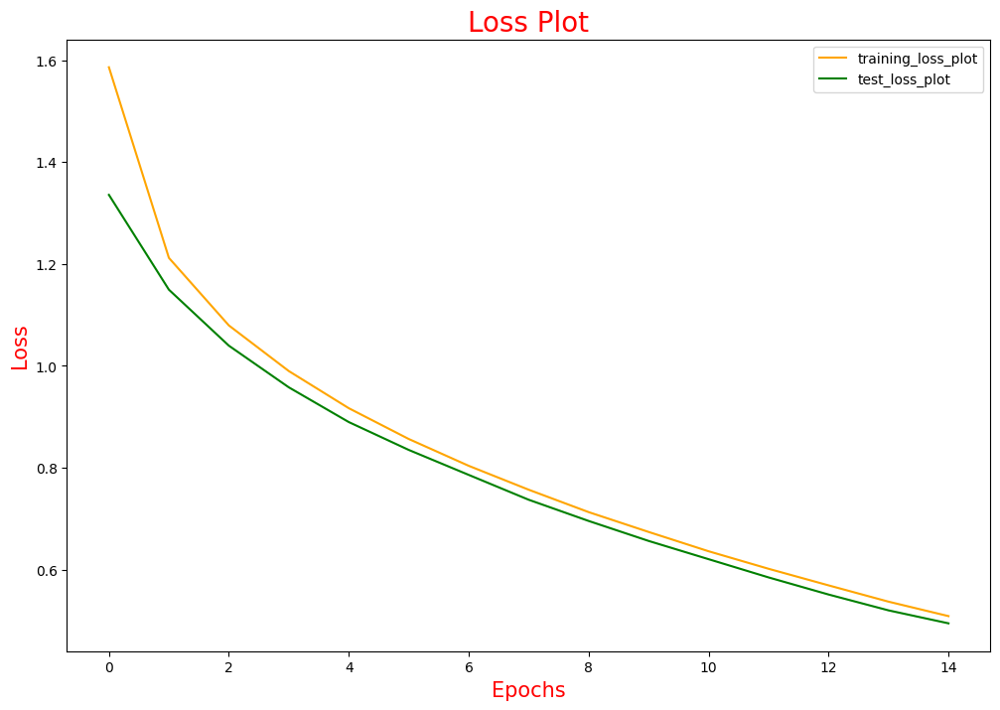

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()


Test Loss : Indicated by the green line, shows a steady pattern along with training loss (indicated by orange), despite the use of teacher forcing

Also, we will stick to 15 approaches and not increase them further, as the intent here is not to create the state of art model. Rather understand how to integrate attention mechanism with E-D architecture for images.

NOTE :
Since there is a difference between the train & test steps (Presence of teacher forcing), you may observe that the train loss is decreasing while your test loss is not.

This doesn't mean that the model is overfitting, as we can't compare the train & test results here, as both approach is different.

Final Model Evaluation

¶
1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

Greedy Search
This method is a simple approximation technique which calculates the probability of the words according to their occurrence in the English vocabulary.

It takes the sample of the words, finds the probability of each of the words, and then outputs the word with the highest probability.

Greedy Search will always consider only one best alternative and this makes the computational speed of the model fast, but the accuracy might not be up to the mark.

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input) # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val) # extract the features by passing the input to encoder

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) # get the output from decoder

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() #extract the predicted id(embedded value) which carries the max value
        #map the id to the word from tokenizer and append the value to the result list
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [ ]:
def evaluate_hindi(image):
    attention_plot_hindi = np.zeros((max_length_hindi, attention_feature_shape))

    hidden_hindi = decoder_hindi.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0)  # Process the input image to the desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input)  # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features_hindi = encoder_hindi(img_tensor_val)  # Extract the features by passing the input to encoder

    dec_input_hindi = tf.expand_dims([tokenizer_hindi.word_index['<start>']], 0)
    result_hindi = []

    for i in range(max_length_hindi):
        predictions_hindi, hidden_hindi, attention_weights_hindi = decoder_hindi(dec_input_hindi, features_hindi, hidden_hindi)  # Get the output from decoder

        attention_plot_hindi[i] = tf.reshape(attention_weights_hindi, (-1,)).numpy()

        predicted_id_hindi = tf.argmax(predictions_hindi[0]).numpy()  # Extract the predicted id (embedded value) which carries the max value
        # Map the id to the word from tokenizer and append the value to the result list
        result_hindi.append(tokenizer_hindi.index_word[predicted_id_hindi])

        if tokenizer_hindi.index_word[predicted_id_hindi] == '<end>':
            return result_hindi, attention_plot_hindi, predictions_hindi

        dec_input_hindi = tf.expand_dims([predicted_id_hindi], 0)

    attention_plot_hindi = attention_plot_hindi[:len(result_hindi), :]
    return result_hindi, attention_plot_hindi, predictions_hindi


In [ ]:
from matplotlib.font_manager import FontProperties

# Set the font properties for Devanagari script
devanagari_font = FontProperties(fname='/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf')

def plot_attention_map(caption_eng, weights_eng, caption_hin, weights_hin, image):
    fig, axes = plt.subplots(2, len(caption_eng), figsize=(15, 10))
    temp_img = np.array(Image.open(image))

    for i in range(len(caption_eng)):
        # English Caption and Attention Weights
        weights_img_eng = np.reshape(weights_eng[i], (8, 8))
        weights_img_eng = np.array(Image.fromarray(weights_img_eng).resize((224, 224), Image.LANCZOS))

        ax_eng = axes[0, i]
        ax_eng.set_title(caption_eng[i], fontsize=14, color='red')

        img = ax_eng.imshow(temp_img)
        ax_eng.imshow(weights_img_eng, cmap='gist_heat', alpha=0.6, extent=img.get_extent())
        ax_eng.axis('off')

        # Hindi Caption and Attention Weights
        if i < len(caption_hin):
            weights_img_hin = np.reshape(weights_hin[i], (8, 8))
            weights_img_hin = np.array(Image.fromarray(weights_img_hin).resize((224, 224), Image.LANCZOS))

            ax_hin = axes[1, i]
            ax_hin.set_title(caption_hin[i], fontsize=14, fontproperties=devanagari_font, color='blue')

            img = ax_hin.imshow(temp_img)
            ax_hin.imshow(weights_img_hin, cmap='gist_heat', alpha=0.6, extent=img.get_extent())
            ax_hin.axis('off')

    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()


In [ ]:
from nltk.translate.bleu_score import sentence_bleu

def filt_text(text):
    filt = ['<start>', '<unk>', '<end>']
    temp = text.split()
    [temp.remove(j) for k in filt for j in temp if k == j]
    text = ' '.join(temp)
    return text

image_test = path_test.copy()


In [ ]:
!pip install bert-score


In [ ]:
from bert_score import score as bert_score_func
from nltk.translate.meteor_score import meteor_score
from nltk.translate.bleu_score import sentence_bleu
from gtts import gTTS
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def compute_bert_score(candidate, reference):
    """
    Computes BERTScore for a single candidate and reference pair.
    """
    _, _, F1 = bert_score_func([candidate], [reference], lang="en", rescale_with_baseline=True)
    return F1.mean().item()

def compute_meteor_score(candidate, reference):
    """
    Computes METEOR score for a single candidate and reference pair.
    """
    return meteor_score([reference], candidate)


In [ ]:
def pred_caption_audio(random, autoplay=False, weights=(0.5, 0.5, 0, 0)):
    # Copy the test captions data
    cap_test_data_eng = caption_test.copy()
    cap_test_data_hin = caption_test_hindi.copy()

    rid = np.random.randint(0, random)
    test_image = image_test[rid]

    # Get real captions for both English and Hindi
    real_caption_eng = ' '.join([tokenizer.index_word[i] for i in cap_test_data_eng[rid] if i not in [0]])
    real_caption_hin = ' '.join([tokenizer_hindi.index_word[i] for i in cap_test_data_hin[rid] if i not in [0]])

    # Evaluate the image for English
    result_eng, attention_plot_eng, pred_test_eng = evaluate(test_image)
    # Evaluate the image for Hindi
    result_hin, attention_plot_hin, pred_test_hin = evaluate_hindi(test_image)

    # Filter the real captions to remove tokens
    real_caption_eng = filt_text(real_caption_eng)
    real_caption_hin = filt_text(real_caption_hin)

    # Get the predicted captions
    pred_caption_eng = ' '.join(result_eng).rsplit(' ', 1)[0]
    pred_caption_hin = ' '.join(result_hin).rsplit(' ', 1)[0]

    # Tokenize the captions for METEOR score calculation
    candidate_eng = pred_caption_eng.split()
    reference_eng = real_caption_eng.split()
    candidate_hin = pred_caption_hin.split()
    reference_hin = real_caption_hin.split()

    # Compute BLEU score for both languages
    score_eng = sentence_bleu([reference_eng], candidate_eng, weights=weights)
    score_hin = sentence_bleu([reference_hin], candidate_hin, weights=weights)

    # Compute BERTScore and METEOR Score for both languages
    bert_score_eng = compute_bert_score(pred_caption_eng, real_caption_eng)
    meteor_score_eng = compute_meteor_score(candidate_eng, reference_eng)  # Use tokenized lists
    bert_score_hin = compute_bert_score(pred_caption_hin, real_caption_hin)
    meteor_score_hin = compute_meteor_score(candidate_hin, reference_hin)  # Use tokenized lists

    # Print all scores and captions
    print(f"BLEU score (English): {score_eng * 100}")
    print(f"BLEU score (Hindi): {score_hin * 100}")
    print(f"BERTScore (English) F1: {bert_score_eng}")
    print(f"METEOR Score (English): {meteor_score_eng}")
    print(f"BERTScore (Hindi) F1: {bert_score_hin}")
    print(f"METEOR Score (Hindi): {meteor_score_hin}")
    print('Real Caption (English):', real_caption_eng)
    print('Predicted Caption (English):', pred_caption_eng)
    print('Real Caption (Hindi):', real_caption_hin)
    print('Predicted Caption (Hindi):', pred_caption_hin)

    # Convert the English caption to speech
    speech_eng = gTTS('Predicted English Caption: ' + pred_caption_eng, lang='en', slow=False)
    speech_eng.save('voice_eng.mp3')

    # Play the audio files
    display.display(display.Audio('voice_eng.mp3', rate=None, autoplay=autoplay))

    return test_image

test_image = pred_caption_audio(len(image_test), True, weights=(0.5, 0.25, 0, 0))
Image.open(test_image)


In [ ]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

In [ ]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

In [ ]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

In [ ]:
test_image = pred_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)